### Stratified Rando Sampling & Segmentation Data Pipeline :

1. Loads .tif images and masks, resizes, standardizes, and applies per-band percentile stretch.
2. Computes mask coverage fraction for each sample and assigns it to a coverage bin (0–25%, 25–50%, 50–75%, 75–100%).
3. Performs stratified train/validation/test split based on coverage bins to maintain balanced representation.
4. Defines two augmentation pipelines: one for sparse masks (low coverage) and one for dense masks.
5. Custom SegmentationDataGenerator applies preprocessing + appropriate augmentations per batch.
6. Supports mixed precision training for faster model performance.
7. Ensures the model sees balanced coverage classes and augmented variability, improving learning for rare objects.

In [1]:
import os
import random
import math
from glob import glob
from collections import Counter

import numpy as np
import pandas as pd
import tifffile as tiff
from PIL import Image

import matplotlib.pyplot as plt
import albumentations as A

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.utils import Sequence
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.schedules import CosineDecayRestarts
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

from sklearn.model_selection import train_test_split


/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/programs/project_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Config
IMAGE_DIR = r"/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/Project/Datasets/simple_cropping_image_64"
MASK_DIR  = r"/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/Project/Datasets/simple_cropping_mask_64"
IMG_SIZE = (64, 64)           # (H, W)
BATCH_SIZE = 16
SEED = 42
AUTOTUNE = tf.data.AUTOTUNE

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [3]:
def read_tif(path):
    """Return numpy array from a tif file (no resizing)."""
    arr = tiff.imread(path)
    return arr

In [4]:
def preprocess_image_tif(img, out_size=IMG_SIZE):
    """
    img: numpy array HxWxC (likely C=3 in order (NIR,R,G) or similar)
    Returns: HxWx3 float32 image (standardized)
    """
    # reorder bands to (R, G, NIR)
    img = img[..., [1, 2, 0]].astype(np.float32)

    # optional resizing using PIL bilinear
    if img.shape[0:2] != out_size:
        pil = Image.fromarray(img.astype(np.uint8))
        pil = pil.resize((out_size[1], out_size[0]), resample=Image.BILINEAR)
        img = np.array(pil).astype(np.float32)

    # Per-band percentile stretch 2-98
    img_stretch = np.zeros_like(img, dtype=np.float32)
    for c in range(img.shape[-1]):
        band = img[..., c]
        low, high = np.percentile(band, (2, 98))
        band_clipped = np.clip(band, low, high)
        # scale to 0-1
        band_norm = (band_clipped - low) / (high - low + 1e-8)
        img_stretch[..., c] = band_norm

    # Per-band standardization (zero mean unit std)
    for c in range(img_stretch.shape[-1]):
        b = img_stretch[..., c]
        img_stretch[..., c] = (b - b.mean()) / (b.std() + 1e-8)

    return img_stretch.astype(np.float32)  # float32 standardized image


In [5]:
def preprocess_mask_tif(mask_path, out_size=IMG_SIZE):
    """
    Loads mask using tifffile, resizes with PIL using NEAREST, and returns binary mask HxW x1 float32
    """
    m = read_tif(mask_path)
    # ensure single channel
    if m.ndim > 2:
        m = m[..., 0]
    pil = Image.fromarray(m.astype(np.uint8))
    if pil.size != (out_size[1], out_size[0]):
        pil = pil.resize((out_size[1], out_size[0]), resample=Image.NEAREST)
    arr = np.array(pil)
    arr = (arr > 0).astype(np.float32)
    return np.expand_dims(arr, -1)


In [6]:
def calc_coverage_fraction(mask_path):
    m = preprocess_mask_tif(mask_path, out_size=IMG_SIZE)  # already resized
    return float(np.sum(m) / (IMG_SIZE[0] * IMG_SIZE[1]))


In [7]:
image_paths = sorted(glob(os.path.join(IMAGE_DIR, "*.tif")))
mask_paths  = sorted(glob(os.path.join(MASK_DIR, "*.tif")))
assert len(image_paths) == len(mask_paths), "Image/mask count mismatch!"

data = []
print("Calculating coverage for all masks (this may take a moment)...")
for img_p, m_p in zip(image_paths, mask_paths):
    cov = calc_coverage_fraction(m_p)   # value in [0,1]
    data.append((img_p, m_p, cov))
print("Done. Samples:", len(data))


Calculating coverage for all masks (this may take a moment)...
Done. Samples: 1584


In [8]:
coverages = np.array([d[2] for d in data])
q25, q50, q75 = np.percentile(coverages, [25, 50, 75])
# bins in fraction units
bins = [0.0, q25, q50, q75, 1.0001]
print(f"Quantile cutoffs (fractions): q25={q25:.6f}, q50={q50:.6f}, q75={q75:.6f}")
print("Bins:", bins)

def assign_bin_fraction(cov):
    # returns bin id 0..3
    for i in range(len(bins)-1):
        if bins[i] <= cov < bins[i+1]:
            return i
    return len(bins)-2

# attach bin ids
data_with_bins = [(p[0], p[1], p[2], assign_bin_fraction(p[2])) for p in data]
print("Bin counts:", Counter([d[3] for d in data_with_bins]))


Quantile cutoffs (fractions): q25=0.016357, q50=0.034912, q75=0.066406
Bins: [0.0, np.float64(0.016357421875), np.float64(0.034912109375), np.float64(0.06640625), 1.0001]
Bin counts: Counter({3: 401, 2: 397, 1: 396, 0: 390})


In [9]:
labels = [d[3] for d in data_with_bins]
train_data, temp = train_test_split(data_with_bins, train_size=0.7, stratify=labels, random_state=SEED)
temp_labels = [d[3] for d in temp]
val_data, test_data = train_test_split(temp, test_size=0.5, stratify=temp_labels, random_state=SEED)

print("Split sizes -> train:", len(train_data), "val:", len(val_data), "test:", len(test_data))
print("Train bin counts:", Counter([d[3] for d in train_data]))
print("Val bin counts:", Counter([d[3] for d in val_data]))
print("Test bin counts:", Counter([d[3] for d in test_data]))


Split sizes -> train: 1108 val: 238 test: 238
Train bin counts: Counter({3: 280, 2: 278, 1: 277, 0: 273})
Val bin counts: Counter({3: 61, 1: 60, 2: 59, 0: 58})
Test bin counts: Counter({3: 60, 2: 60, 1: 59, 0: 59})


In [10]:
normal_aug = A.Compose([
    A.OneOf([A.VerticalFlip(p=1), A.HorizontalFlip(p=1), A.Transpose(p=1)], p=0.5),
    A.OneOf([A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, border_mode=0, p=1),
             A.GridDistortion(p=1)], p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.GaussNoise(var_limit=(10, 50), p=0.3)
], p=1.0)

sparse_aug = A.Compose([
    A.RandomResizedCrop(size=IMG_SIZE, scale=(0.5, 1.0), ratio=(0.8, 1.2), p=0.7),
    A.OneOf([A.VerticalFlip(p=1), A.HorizontalFlip(p=1)], p=0.5),
    A.RandomBrightnessContrast(p=0.7),
    A.GaussNoise(var_limit=(10, 50), p=0.5)
], p=1.0)


/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/programs/project_env/lib/python3.10/site-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/var/folders/pb/fpj0s2gj13zg3wdmycllzvxm0000gn/T/ipykernel_5318/828717061.py:6: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=0.3)
/var/folders/pb/fpj0s2gj13zg3wdmycllzvxm0000gn/T/ipykernel_5318/828717061.py:13: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10, 50), p=0.5)


In [11]:
class SegmentationDataGenerator(Sequence):
    def __init__(self, data_list, batch_size=BATCH_SIZE, augment=True, shuffle=True):
        self.data_list = data_list
        self.batch_size = batch_size
        self.augment = augment
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return math.ceil(len(self.data_list) / self.batch_size)

    def on_epoch_end(self):
        self.indices = np.arange(len(self.data_list))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __getitem__(self, index):
        batch_idx = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        batch_items = [self.data_list[i] for i in batch_idx]

        Xs = []
        Ys = []

        for img_p, mask_p, cov, bin_id in batch_items:
            # load raw tif and preprocess
            raw_img = read_tif(img_p)
            img_std = preprocess_image_tif(raw_img, out_size=IMG_SIZE)  # float32 standardized

            mask = preprocess_mask_tif(mask_p, out_size=IMG_SIZE)       # float32 {0,1} shape HxWx1

            # choose augmentation pipeline
            if self.augment:
                aug = sparse_aug if bin_id == 0 else normal_aug
                # alb expects uint8 0-255; convert standardized img back to 0-255 for augmentation,
                # but keep a copy of original standardized for model input after augmentation applied.
                # We perform stretch back to uint8 by rescaling each channel to 0-255 using min/max per-channel
                img_for_aug = np.zeros_like(img_std)
                for c in range(img_std.shape[-1]):
                    ch = img_std[..., c]
                    # min/max of standardized will vary; bring to 0-1 by using tanh-like mapping: (ch - ch.min)/(ch.max-ch.min)
                    mn, mx = ch.min(), ch.max()
                    if mx - mn < 1e-6:
                        scaled = np.zeros_like(ch)
                    else:
                        scaled = (ch - mn) / (mx - mn)
                    img_for_aug[..., c] = (scaled * 255.0)
                img_for_aug = np.clip(img_for_aug, 0, 255).astype(np.uint8)
                mask_for_aug = (mask.squeeze() * 255.0).astype(np.uint8)

                aug_res = aug(image=img_for_aug, mask=mask_for_aug)
                aug_img_u8 = aug_res["image"]  # uint8 0-255
                aug_mask_u8 = aug_res["mask"]

                # convert augmented image back to float32 standardized approximate
                # we will re-normalize per-channel: scale 0-255 -> 0-1 then standardize (mean,std of original band)
                aug_img_f = aug_img_u8.astype(np.float32) / 255.0

                # compute per-channel mean/std from original img_std to standardize augmented image similarly
                aug_img_std = np.zeros_like(aug_img_f)
                for c in range(aug_img_f.shape[-1]):
                    orig_band = img_std[..., c]
                    mean = orig_band.mean()
                    std = orig_band.std() + 1e-8
                    # map aug_img_f [0,1] to standardized space roughly: (aug - aug_mean) * (orig_std/aug_std) + orig_mean
                    # simpler: scale to zero mean unit std using aug stats then map to orig stats
                    a_mean = aug_img_f[..., c].mean()
                    a_std = aug_img_f[..., c].std() + 1e-8
                    aug_img_std[..., c] = ((aug_img_f[..., c] - a_mean) / a_std) * std + mean

                img_final = aug_img_std.astype(np.float32)
                mask_final = (aug_mask_u8 > 127).astype(np.float32)[..., None]
            else:
                img_final = img_std
                mask_final = mask

            # ensure shapes
            Xs.append(img_final)
            Ys.append(mask_final)

        X = np.array(Xs, dtype=np.float32)
        y = np.array(Ys, dtype=np.float32)

        return X, y


In [12]:
try:
    from tensorflow.keras import mixed_precision
    mixed_precision.set_global_policy('mixed_float16')
    print("Mixed precision enabled: policy =", mixed_precision.global_policy())
except Exception as e:
    print("Mixed precision not set (may not be available):", e)


Mixed precision enabled: policy = <DTypePolicy "mixed_float16">


### MultiResUNet Model Training with Tversky Loss :

1. This section defines the MultiResUNet segmentation model for 64×64 images.
2. Implements Dice, Focal, and combined Tversky loss functions for handling class imbalance.
3. Defines metrics like Dice coefficient and IoU for model evaluation.
4. Compiles the model with Adam optimizer and prepares train/validation/test generators.
5. Sets up callbacks (checkpoint, early stopping, LR reduction) and trains the model for 50 epochs.

In [13]:
# Importing the required Packages 
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import Sequence
from sklearn.model_selection import train_test_split
import tifffile as tiff
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

import sys
sys.path.append("/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/programs/MultiResUNet/tensorflow")
from MultiResUNet import MultiResUnet

In [14]:
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('float32')  # All model layers output float32

In [15]:
# Defining Tversky Loss Function
import tensorflow as tf

def tversky_loss(alpha=0.5, beta=0.5):
    """
    Tversky loss for binary segmentation.
    alpha controls penalty for false positives
    beta controls penalty for false negatives
    """
    def loss(y_true, y_pred):
        # Cast to float32
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)

        # Clip predictions to avoid NaNs
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)

        # Compute components per image in batch
        TP = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
        FP = tf.reduce_sum((1 - y_true) * y_pred, axis=[1, 2, 3])
        FN = tf.reduce_sum(y_true * (1 - y_pred), axis=[1, 2, 3])

        # Compute Tversky index per image
        tversky_index = (TP + 1e-7) / (TP + alpha * FP + beta * FN + 1e-7)

        # Return batch mean loss
        return tf.reduce_mean(1.0 - tversky_index)

    return loss


In [16]:
# Defining the metrices
def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou_score(y_true, y_pred, smooth=1):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

In [20]:
# Model creation
model = MultiResUnet(height=64, width=64, n_channels=3)
model.compile(
    optimizer='adam',
    loss=tversky_loss(alpha = 0.5, beta = 0.7),
    metrics=['accuracy', dice_coef, iou_score]  # assuming you've defined these
)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 64, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64, 8) │        216 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64, 8) │         24 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 64, 64, 8) │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      1,224 │ activation[0][0]  │
│                     │ 17)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │         51 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 17)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 17)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      3,978 │ activation_1[0][… │
│                     │ 26)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │         78 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 26)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 26)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 64, 64,    │        153 │ input_layer[0][0] │
│                     │ 51)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 64, 64,    │          0 │ activation[0][0], │
│ (Concatenate)       │ 51)               │            │ activation_1[0][… │
│                     │                   │            │ activation_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 64, 64,    │        153 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 51)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        204 │ concatenate[0][0] │
│ (BatchNormalizatio… │ 51)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 64, 64,    │          0 │ batch_normalizat… │
│                     │ 51)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 64, 64,    │          0 │ add[0][0]         │
│ (Activation)        │ 51)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        204 │ activation_3[0][

 Total params: 7,262,750 (27.71 MB)

 Trainable params: 7,238,228 (27.61 MB)

 Non-trainable params: 24,522 (95.79 KB)

In [17]:
train_gen = SegmentationDataGenerator(train_data, batch_size=BATCH_SIZE, augment=True, shuffle=True)
val_gen   = SegmentationDataGenerator(val_data,   batch_size=BATCH_SIZE, augment=False, shuffle=False)
test_gen  = SegmentationDataGenerator(test_data,  batch_size=BATCH_SIZE, augment=False, shuffle=False)

# Quick sanity check shapes
X_sample, y_sample = train_gen[0]
print("Sample batch shapes:", X_sample.shape, y_sample.shape)

Sample batch shapes: (16, 64, 64, 3) (16, 64, 64, 1)


In [22]:
# Callbacks
checkpoint = ModelCheckpoint("best_tversky_loss.h5", monitor="val_dice_coef",
                             mode="max", save_best_only=True, verbose=1)
early_stop = EarlyStopping(monitor="val_dice_coef", patience=10, mode="max", verbose=1, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_dice_coef", mode="max", factor=0.5, patience=5,
                              min_lr=1e-6, verbose=1)

In [23]:
# Training the Model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,
    callbacks=[checkpoint, early_stop, reduce_lr]
)

Epoch 1/50


/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/programs/project_env/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 504ms/step - accuracy: 0.5790 - dice_coef: 0.1162 - iou_score: 0.0619 - loss: 0.8889
Epoch 1: val_dice_coef improved from None to 0.12272, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 54s 550ms/step - accuracy: 0.6166 - dice_coef: 0.1209 - iou_score: 0.0645 - loss: 0.8840 - val_accuracy: 0.6116 - val_dice_coef: 0.1227 - val_iou_score: 0.0656 - val_loss: 0.8857 - learning_rate: 0.0010
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - accuracy: 0.6588 - dice_coef: 0.1274 - iou_score: 0.0682 - loss: 0.8762
Epoch 2: val_dice_coef improved from 0.12272 to 0.13890, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 38s 549ms/step - accuracy: 0.6665 - dice_coef: 0.1292 - iou_score: 0.0692 - loss: 0.8745 - val_accuracy: 0.7367 - val_dice_coef: 0.1389 - val_iou_score: 0.0749 - val_loss: 0.8718 - learning_rate: 0.0010
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 530ms/step - accuracy: 0.6835 - dice_coef: 0.1239 - iou_score: 0.0662 - loss: 0.8778
Epoch 3: val_dice_coef did not improve from 0.13890
70/70 ━━━━━━━━━━━━━━━━━━━━ 39s 559ms/step - accuracy: 0.6880 - dice_coef: 0.1315 - iou_score: 0.0706 - loss: 0.8696 - val_accuracy: 0.9414 - val_dice_coef: 0.0063 - val_iou_score: 0.0033 - val_loss: 0.9975 - learning_rate: 0.0010
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 545ms/step - accuracy: 0.7185 - dice_coef: 0.1340 - iou_score: 0.0721 - loss: 0.8652
Epoch 4: val_dice_coef did not improve from 0.13890
70/70 ━━━━━━━━━━━━━━━━━━━━ 40s 576ms/step - accuracy: 0.7201 - dice_coef: 0.1336 - iou_score: 0.0718 - loss: 0.8654 - val_accuracy: 0.8388 - val_dice_coef: 0.0800 - val_iou_score: 0.04

70/70 ━━━━━━━━━━━━━━━━━━━━ 43s 624ms/step - accuracy: 0.7425 - dice_coef: 0.1361 - iou_score: 0.0732 - loss: 0.8614 - val_accuracy: 0.8096 - val_dice_coef: 0.1996 - val_iou_score: 0.1118 - val_loss: 0.7679 - learning_rate: 0.0010
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 620ms/step - accuracy: 0.7546 - dice_coef: 0.1316 - iou_score: 0.0707 - loss: 0.8658
Epoch 6: val_dice_coef did not improve from 0.19963
70/70 ━━━━━━━━━━━━━━━━━━━━ 46s 652ms/step - accuracy: 0.7680 - dice_coef: 0.1397 - iou_score: 0.0754 - loss: 0.8582 - val_accuracy: 0.7288 - val_dice_coef: 0.0911 - val_iou_score: 0.0480 - val_loss: 0.9212 - learning_rate: 0.0010
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 621ms/step - accuracy: 0.7961 - dice_coef: 0.1389 - iou_score: 0.0748 - loss: 0.8571
Epoch 7: val_dice_coef did not improve from 0.19963
70/70 ━━━━━━━━━━━━━━━━━━━━ 46s 656ms/step - accuracy: 0.7966 - dice_coef: 0.1435 - iou_score: 0.0775 - loss: 0.8530 - val_accuracy: 0.7997 - val_dice_coef: 0.1630 - val_iou_score: 0.08

70/70 ━━━━━━━━━━━━━━━━━━━━ 46s 656ms/step - accuracy: 0.8549 - dice_coef: 0.1530 - iou_score: 0.0831 - loss: 0.8456 - val_accuracy: 0.9000 - val_dice_coef: 0.2089 - val_iou_score: 0.1172 - val_loss: 0.7906 - learning_rate: 0.0010
Epoch 11/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - accuracy: 0.8666 - dice_coef: 0.1531 - iou_score: 0.0831 - loss: 0.8436
Epoch 11: val_dice_coef improved from 0.20886 to 0.23333, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 48s 682ms/step - accuracy: 0.8703 - dice_coef: 0.1557 - iou_score: 0.0847 - loss: 0.8407 - val_accuracy: 0.8912 - val_dice_coef: 0.2333 - val_iou_score: 0.1328 - val_loss: 0.7858 - learning_rate: 0.0010
Epoch 12/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 652ms/step - accuracy: 0.8798 - dice_coef: 0.1618 - iou_score: 0.0884 - loss: 0.8379
Epoch 12: val_dice_coef did not improve from 0.23333
70/70 ━━━━━━━━━━━━━━━━━━━━ 48s 688ms/step - accuracy: 0.8838 - dice_coef: 0.1619 - iou_score: 0.0884 - loss: 0.8378 - val_accuracy: 0.9263 - val_dice_coef: 0.2071 - val_iou_score: 0.1161 - val_loss: 0.8005 - learning_rate: 0.0010
Epoch 13/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 673ms/step - accuracy: 0.8902 - dice_coef: 0.1691 - iou_score: 0.0926 - loss: 0.8312
Epoch 13: val_dice_coef did not improve from 0.23333
70/70 ━━━━━━━━━━━━━━━━━━━━ 50s 708ms/step - accuracy: 0.8936 - dice_coef: 0.1675 - iou_score: 0.0916 - loss: 0.8325 - val_accuracy: 0.9271 - val_dice_coef: 0.2169 - val_iou_score: 

70/70 ━━━━━━━━━━━━━━━━━━━━ 50s 708ms/step - accuracy: 0.9084 - dice_coef: 0.1759 - iou_score: 0.0969 - loss: 0.8270 - val_accuracy: 0.9280 - val_dice_coef: 0.2345 - val_iou_score: 0.1335 - val_loss: 0.7776 - learning_rate: 0.0010
Epoch 16/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 686ms/step - accuracy: 0.9160 - dice_coef: 0.1840 - iou_score: 0.1016 - loss: 0.8224
Epoch 16: val_dice_coef improved from 0.23445 to 0.23873, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 50s 722ms/step - accuracy: 0.9160 - dice_coef: 0.1825 - iou_score: 0.1007 - loss: 0.8237 - val_accuracy: 0.9381 - val_dice_coef: 0.2387 - val_iou_score: 0.1361 - val_loss: 0.7820 - learning_rate: 0.0010
Epoch 17/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 696ms/step - accuracy: 0.9199 - dice_coef: 0.1827 - iou_score: 0.1009 - loss: 0.8220
Epoch 17: val_dice_coef did not improve from 0.23873
70/70 ━━━━━━━━━━━━━━━━━━━━ 51s 730ms/step - accuracy: 0.9197 - dice_coef: 0.1872 - iou_score: 0.1036 - loss: 0.8203 - val_accuracy: 0.9398 - val_dice_coef: 0.2299 - val_iou_score: 0.1305 - val_loss: 0.7874 - learning_rate: 0.0010
Epoch 18/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 672ms/step - accuracy: 0.9246 - dice_coef: 0.1933 - iou_score: 0.1074 - loss: 0.8139
Epoch 18: val_dice_coef improved from 0.23873 to 0.24653, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 50s 709ms/step - accuracy: 0.9259 - dice_coef: 0.1917 - iou_score: 0.1065 - loss: 0.8155 - val_accuracy: 0.9451 - val_dice_coef: 0.2465 - val_iou_score: 0.1412 - val_loss: 0.7717 - learning_rate: 0.0010
Epoch 19/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 666ms/step - accuracy: 0.9297 - dice_coef: 0.1933 - iou_score: 0.1073 - loss: 0.8147
Epoch 19: val_dice_coef did not improve from 0.24653
70/70 ━━━━━━━━━━━━━━━━━━━━ 49s 699ms/step - accuracy: 0.9296 - dice_coef: 0.1995 - iou_score: 0.1111 - loss: 0.8110 - val_accuracy: 0.9037 - val_dice_coef: 0.2453 - val_iou_score: 0.1406 - val_loss: 0.7624 - learning_rate: 0.0010
Epoch 20/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 669ms/step - accuracy: 0.9347 - dice_coef: 0.2064 - iou_score: 0.1156 - loss: 0.8043
Epoch 20: val_dice_coef improved from 0.24653 to 0.26049, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 49s 706ms/step - accuracy: 0.9324 - dice_coef: 0.2039 - iou_score: 0.1140 - loss: 0.8079 - val_accuracy: 0.9429 - val_dice_coef: 0.2605 - val_iou_score: 0.1505 - val_loss: 0.7627 - learning_rate: 0.0010
Epoch 21/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 670ms/step - accuracy: 0.9371 - dice_coef: 0.2027 - iou_score: 0.1132 - loss: 0.8091
Epoch 21: val_dice_coef did not improve from 0.26049
70/70 ━━━━━━━━━━━━━━━━━━━━ 49s 705ms/step - accuracy: 0.9370 - dice_coef: 0.2119 - iou_score: 0.1189 - loss: 0.8026 - val_accuracy: 0.9536 - val_dice_coef: 0.2578 - val_iou_score: 0.1485 - val_loss: 0.7743 - learning_rate: 0.0010
Epoch 22/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 671ms/step - accuracy: 0.9374 - dice_coef: 0.2195 - iou_score: 0.1237 - loss: 0.7986
Epoch 22: val_dice_coef improved from 0.26049 to 0.26722, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 49s 707ms/step - accuracy: 0.9372 - dice_coef: 0.2176 - iou_score: 0.1224 - loss: 0.8010 - val_accuracy: 0.9540 - val_dice_coef: 0.2672 - val_iou_score: 0.1548 - val_loss: 0.7655 - learning_rate: 0.0010
Epoch 23/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 702ms/step - accuracy: 0.9397 - dice_coef: 0.2256 - iou_score: 0.1278 - loss: 0.7936
Epoch 23: val_dice_coef improved from 0.26722 to 0.28811, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 52s 741ms/step - accuracy: 0.9404 - dice_coef: 0.2206 - iou_score: 0.1246 - loss: 0.7972 - val_accuracy: 0.9517 - val_dice_coef: 0.2881 - val_iou_score: 0.1689 - val_loss: 0.7477 - learning_rate: 0.0010
Epoch 24/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 714ms/step - accuracy: 0.9426 - dice_coef: 0.2312 - iou_score: 0.1311 - loss: 0.7907
Epoch 24: val_dice_coef did not improve from 0.28811
70/70 ━━━━━━━━━━━━━━━━━━━━ 52s 749ms/step - accuracy: 0.9422 - dice_coef: 0.2284 - iou_score: 0.1294 - loss: 0.7935 - val_accuracy: 0.9572 - val_dice_coef: 0.2867 - val_iou_score: 0.1679 - val_loss: 0.7548 - learning_rate: 0.0010
Epoch 25/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 702ms/step - accuracy: 0.9445 - dice_coef: 0.2305 - iou_score: 0.1307 - loss: 0.7927
Epoch 25: val_dice_coef improved from 0.28811 to 0.31254, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 52s 742ms/step - accuracy: 0.9444 - dice_coef: 0.2335 - iou_score: 0.1327 - loss: 0.7908 - val_accuracy: 0.9370 - val_dice_coef: 0.3125 - val_iou_score: 0.1861 - val_loss: 0.7364 - learning_rate: 0.0010
Epoch 26/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 702ms/step - accuracy: 0.9441 - dice_coef: 0.2382 - iou_score: 0.1359 - loss: 0.7885
Epoch 26: val_dice_coef improved from 0.31254 to 0.32830, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 52s 744ms/step - accuracy: 0.9432 - dice_coef: 0.2345 - iou_score: 0.1335 - loss: 0.7922 - val_accuracy: 0.9470 - val_dice_coef: 0.3283 - val_iou_score: 0.1971 - val_loss: 0.7313 - learning_rate: 0.0010
Epoch 27/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 695ms/step - accuracy: 0.9444 - dice_coef: 0.2429 - iou_score: 0.1388 - loss: 0.7888
Epoch 27: val_dice_coef did not improve from 0.32830
70/70 ━━━━━━━━━━━━━━━━━━━━ 51s 729ms/step - accuracy: 0.9452 - dice_coef: 0.2441 - iou_score: 0.1395 - loss: 0.7871 - val_accuracy: 0.9489 - val_dice_coef: 0.3109 - val_iou_score: 0.1847 - val_loss: 0.7420 - learning_rate: 0.0010
Epoch 28/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 705ms/step - accuracy: 0.9483 - dice_coef: 0.2426 - iou_score: 0.1385 - loss: 0.7880
Epoch 28: val_dice_coef did not improve from 0.32830
70/70 ━━━━━━━━━━━━━━━━━━━━ 52s 738ms/step - accuracy: 0.9481 - dice_coef: 0.2535 - iou_score: 0.1457 - loss: 0.7813 - val_accuracy: 0.9509 - val_dice_coef: 0.3248 - val_iou_score: 

70/70 ━━━━━━━━━━━━━━━━━━━━ 55s 788ms/step - accuracy: 0.9503 - dice_coef: 0.2642 - iou_score: 0.1527 - loss: 0.7758 - val_accuracy: 0.9576 - val_dice_coef: 0.3368 - val_iou_score: 0.2034 - val_loss: 0.7242 - learning_rate: 0.0010
Epoch 31/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 769ms/step - accuracy: 0.9509 - dice_coef: 0.2626 - iou_score: 0.1516 - loss: 0.7784
Epoch 31: val_dice_coef did not improve from 0.33685
70/70 ━━━━━━━━━━━━━━━━━━━━ 56s 805ms/step - accuracy: 0.9510 - dice_coef: 0.2659 - iou_score: 0.1539 - loss: 0.7749 - val_accuracy: 0.9596 - val_dice_coef: 0.3315 - val_iou_score: 0.1993 - val_loss: 0.7292 - learning_rate: 0.0010
Epoch 32/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 740ms/step - accuracy: 0.9510 - dice_coef: 0.2721 - iou_score: 0.1580 - loss: 0.7714
Epoch 32: val_dice_coef improved from 0.33685 to 0.34860, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 54s 778ms/step - accuracy: 0.9518 - dice_coef: 0.2709 - iou_score: 0.1572 - loss: 0.7735 - val_accuracy: 0.9601 - val_dice_coef: 0.3486 - val_iou_score: 0.2119 - val_loss: 0.7194 - learning_rate: 0.0010
Epoch 33/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 703ms/step - accuracy: 0.9520 - dice_coef: 0.2747 - iou_score: 0.1598 - loss: 0.7690
Epoch 33: val_dice_coef did not improve from 0.34860
70/70 ━━━━━━━━━━━━━━━━━━━━ 52s 739ms/step - accuracy: 0.9535 - dice_coef: 0.2801 - iou_score: 0.1633 - loss: 0.7668 - val_accuracy: 0.9585 - val_dice_coef: 0.3448 - val_iou_score: 0.2090 - val_loss: 0.7198 - learning_rate: 0.0010
Epoch 34/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 728ms/step - accuracy: 0.9528 - dice_coef: 0.2914 - iou_score: 0.1711 - loss: 0.7636
Epoch 34: val_dice_coef improved from 0.34860 to 0.36244, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 54s 766ms/step - accuracy: 0.9526 - dice_coef: 0.2835 - iou_score: 0.1658 - loss: 0.7666 - val_accuracy: 0.9545 - val_dice_coef: 0.3624 - val_iou_score: 0.2221 - val_loss: 0.7054 - learning_rate: 0.0010
Epoch 35/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 752ms/step - accuracy: 0.9541 - dice_coef: 0.2918 - iou_score: 0.1716 - loss: 0.7590
Epoch 35: val_dice_coef did not improve from 0.36244
70/70 ━━━━━━━━━━━━━━━━━━━━ 55s 788ms/step - accuracy: 0.9543 - dice_coef: 0.2850 - iou_score: 0.1672 - loss: 0.7651 - val_accuracy: 0.9605 - val_dice_coef: 0.3612 - val_iou_score: 0.2212 - val_loss: 0.7106 - learning_rate: 0.0010
Epoch 36/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 735ms/step - accuracy: 0.9542 - dice_coef: 0.2888 - iou_score: 0.1695 - loss: 0.7624
Epoch 36: val_dice_coef improved from 0.36244 to 0.36614, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 54s 775ms/step - accuracy: 0.9547 - dice_coef: 0.2901 - iou_score: 0.1705 - loss: 0.7628 - val_accuracy: 0.9587 - val_dice_coef: 0.3661 - val_iou_score: 0.2249 - val_loss: 0.7041 - learning_rate: 0.0010
Epoch 37/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 739ms/step - accuracy: 0.9565 - dice_coef: 0.3011 - iou_score: 0.1779 - loss: 0.7575
Epoch 37: val_dice_coef did not improve from 0.36614
70/70 ━━━━━━━━━━━━━━━━━━━━ 54s 775ms/step - accuracy: 0.9560 - dice_coef: 0.2995 - iou_score: 0.1768 - loss: 0.7573 - val_accuracy: 0.9600 - val_dice_coef: 0.3556 - val_iou_score: 0.2169 - val_loss: 0.7148 - learning_rate: 0.0010
Epoch 38/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 792ms/step - accuracy: 0.9559 - dice_coef: 0.3081 - iou_score: 0.1829 - loss: 0.7514
Epoch 38: val_dice_coef improved from 0.36614 to 0.37344, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 58s 837ms/step - accuracy: 0.9559 - dice_coef: 0.3033 - iou_score: 0.1795 - loss: 0.7554 - val_accuracy: 0.9619 - val_dice_coef: 0.3734 - val_iou_score: 0.2303 - val_loss: 0.7029 - learning_rate: 0.0010
Epoch 39/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 772ms/step - accuracy: 0.9552 - dice_coef: 0.3037 - iou_score: 0.1796 - loss: 0.7531
Epoch 39: val_dice_coef improved from 0.37344 to 0.38552, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 57s 811ms/step - accuracy: 0.9561 - dice_coef: 0.3054 - iou_score: 0.1808 - loss: 0.7544 - val_accuracy: 0.9595 - val_dice_coef: 0.3855 - val_iou_score: 0.2396 - val_loss: 0.6902 - learning_rate: 0.0010
Epoch 40/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 745ms/step - accuracy: 0.9571 - dice_coef: 0.3191 - iou_score: 0.1905 - loss: 0.7461
Epoch 40: val_dice_coef did not improve from 0.38552
70/70 ━━━━━━━━━━━━━━━━━━━━ 55s 782ms/step - accuracy: 0.9574 - dice_coef: 0.3116 - iou_score: 0.1854 - loss: 0.7507 - val_accuracy: 0.9604 - val_dice_coef: 0.3777 - val_iou_score: 0.2335 - val_loss: 0.6966 - learning_rate: 0.0010
Epoch 41/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 764ms/step - accuracy: 0.9567 - dice_coef: 0.3094 - iou_score: 0.1836 - loss: 0.7513
Epoch 41: val_dice_coef did not improve from 0.38552
70/70 ━━━━━━━━━━━━━━━━━━━━ 56s 800ms/step - accuracy: 0.9577 - dice_coef: 0.3147 - iou_score: 0.1873 - loss: 0.7499 - val_accuracy: 0.9636 - val_dice_coef: 0.3597 - val_iou_score: 

70/70 ━━━━━━━━━━━━━━━━━━━━ 60s 854ms/step - accuracy: 0.9580 - dice_coef: 0.3164 - iou_score: 0.1888 - loss: 0.7451 - val_accuracy: 0.9645 - val_dice_coef: 0.3859 - val_iou_score: 0.2397 - val_loss: 0.6963 - learning_rate: 0.0010
Epoch 44/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 751ms/step - accuracy: 0.9589 - dice_coef: 0.3252 - iou_score: 0.1947 - loss: 0.7444
Epoch 44: val_dice_coef did not improve from 0.38589
70/70 ━━━━━━━━━━━━━━━━━━━━ 55s 788ms/step - accuracy: 0.9587 - dice_coef: 0.3225 - iou_score: 0.1929 - loss: 0.7475 - val_accuracy: 0.9631 - val_dice_coef: 0.3840 - val_iou_score: 0.2383 - val_loss: 0.6959 - learning_rate: 0.0010
Epoch 45/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 745ms/step - accuracy: 0.9590 - dice_coef: 0.3244 - iou_score: 0.1942 - loss: 0.7428
Epoch 45: val_dice_coef improved from 0.38589 to 0.40754, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 55s 782ms/step - accuracy: 0.9585 - dice_coef: 0.3242 - iou_score: 0.1942 - loss: 0.7467 - val_accuracy: 0.9628 - val_dice_coef: 0.4075 - val_iou_score: 0.2567 - val_loss: 0.6778 - learning_rate: 0.0010
Epoch 46/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 821ms/step - accuracy: 0.9603 - dice_coef: 0.3369 - iou_score: 0.2030 - loss: 0.7410
Epoch 46: val_dice_coef improved from 0.40754 to 0.41587, saving model to best_tversky_loss.h5


70/70 ━━━━━━━━━━━━━━━━━━━━ 61s 868ms/step - accuracy: 0.9597 - dice_coef: 0.3341 - iou_score: 0.2011 - loss: 0.7407 - val_accuracy: 0.9620 - val_dice_coef: 0.4159 - val_iou_score: 0.2633 - val_loss: 0.6685 - learning_rate: 0.0010
Epoch 47/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 818ms/step - accuracy: 0.9594 - dice_coef: 0.3358 - iou_score: 0.2024 - loss: 0.7392
Epoch 47: val_dice_coef did not improve from 0.41587
70/70 ━━━━━━━━━━━━━━━━━━━━ 60s 858ms/step - accuracy: 0.9600 - dice_coef: 0.3359 - iou_score: 0.2028 - loss: 0.7392 - val_accuracy: 0.9630 - val_dice_coef: 0.4102 - val_iou_score: 0.2588 - val_loss: 0.6733 - learning_rate: 0.0010
Epoch 48/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 758ms/step - accuracy: 0.9612 - dice_coef: 0.3323 - iou_score: 0.2003 - loss: 0.7417
Epoch 48: val_dice_coef did not improve from 0.41587
70/70 ━━━━━━━━━━━━━━━━━━━━ 56s 797ms/step - accuracy: 0.9604 - dice_coef: 0.3357 - iou_score: 0.2025 - loss: 0.7392 - val_accuracy: 0.9646 - val_dice_coef: 0.3970 - val_iou_score: 

70/70 ━━━━━━━━━━━━━━━━━━━━ 53s 755ms/step - accuracy: 0.9602 - dice_coef: 0.3370 - iou_score: 0.2033 - loss: 0.7366 - val_accuracy: 0.9621 - val_dice_coef: 0.4358 - val_iou_score: 0.2796 - val_loss: 0.6592 - learning_rate: 0.0010
Epoch 50/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 819ms/step - accuracy: 0.9609 - dice_coef: 0.3431 - iou_score: 0.2079 - loss: 0.7333
Epoch 50: val_dice_coef did not improve from 0.43580
70/70 ━━━━━━━━━━━━━━━━━━━━ 60s 857ms/step - accuracy: 0.9603 - dice_coef: 0.3408 - iou_score: 0.2061 - loss: 0.7362 - val_accuracy: 0.9634 - val_dice_coef: 0.4346 - val_iou_score: 0.2785 - val_loss: 0.6569 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 49.


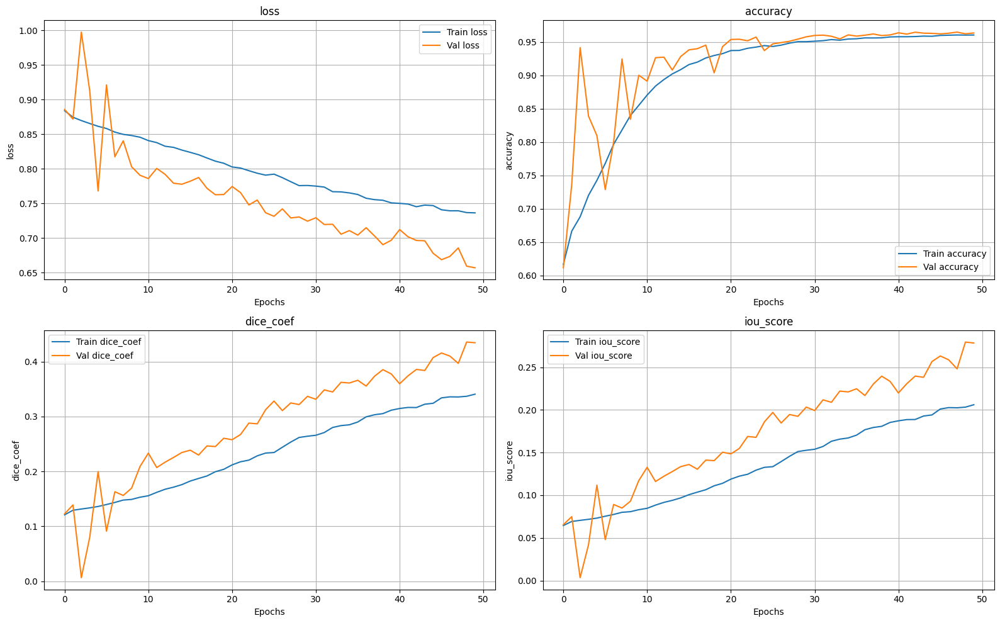

In [24]:
# Plotting the Training Log
import matplotlib.pyplot as plt

def plot_learning_curves(history):
    metrics = ['loss', 'accuracy', 'dice_coef', 'iou_score']
    
    plt.figure(figsize=(16, 10))
    
    for i, metric in enumerate(metrics):
        plt.subplot(2, 2, i + 1)
        plt.plot(history.history[metric], label='Train ' + metric)
        plt.plot(history.history['val_' + metric], label='Val ' + metric)
        plt.title(metric)
        plt.xlabel('Epochs')
        plt.ylabel(metric)
        plt.legend()
        plt.grid(True)
    
    plt.tight_layout()
    plt.show()

plot_learning_curves(history)

### Model Evaluation and Result Visualization :

1. This section loads the trained model and evaluates it on the test set using accuracy, F1 score, Dice coefficient, IoU, and confusion matrix.
2. Predictions are thresholded at 0.5 to generate binary masks.
3. Metrics are computed by flattening all masks across batches for overall performance.
4. Visualizations show side-by-side RGB image, ground truth mask, and predicted mask for qualitative inspection.
5. Confusion matrix and quantitative metrics help assess model accuracy and segmentation quality.

In [18]:
# Checking the Scores of the Model
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Define Dice and IoU functions again (for metric computation later)
def dice_coef_np(y_true, y_pred, smooth=1e-7):
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def iou_score_np(y_true, y_pred, smooth=1e-7):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# Load the model
model_path = "/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/programs/notebooks/Current_working_codes/best_tversky_loss.h5"
model = load_model(model_path, compile=False)

# Evaluate on validation set
y_true_all, y_pred_all = [], []

for i in range(len(test_gen)):
    images, masks = test_gen[i]  # (B, 64, 64, 3), (B, 64, 64, 1)
    preds = model.predict(images, verbose=0)
    preds = (preds > 0.5).astype(np.uint8)

    y_true_all.append(masks.flatten())
    y_pred_all.append(preds.flatten())

# Concatenate batches
y_true_all = np.concatenate(y_true_all)
y_pred_all = np.concatenate(y_pred_all)

# Compute metrics
acc = accuracy_score(y_true_all, y_pred_all)
f1 = f1_score(y_true_all, y_pred_all)
iou = iou_score_np(y_true_all, y_pred_all)
dice = dice_coef_np(y_true_all, y_pred_all)
cm = confusion_matrix(y_true_all, y_pred_all)

# Display results
print(f"✅ Accuracy       : {acc:.4f}")
print(f"✅ Dice Coef      : {dice:.4f}")
print(f"✅ IoU Score      : {iou:.4f}")
print(f"✅ F1 Score       : {f1:.4f}")
print(f"✅ Confusion Matrix:\n{cm}")

✅ Accuracy       : 0.9638
✅ Dice Coef      : 0.6120
✅ IoU Score      : 0.4410
✅ F1 Score       : 0.6120
✅ Confusion Matrix:
[[911730  20248]
 [ 15038  27832]]


In [19]:
import matplotlib.pyplot as plt
import numpy as np

def convert_to_rgb(img):
    """
    Convert (NIR, R, G) to (R, G, NIR) and perform min-max stretch
    """
    # Step 1: Reorder channels to RGB
    rgb = img[..., [1, 2, 0]].astype(np.float32)  # R, G, NIR

    # Step 2: Min-max stretch each channel independently
    for c in range(3):
        band = rgb[..., c]
        rgb[..., c] = (band - band.min()) / (band.max() - band.min() + 1e-8)
    
    return rgb


def visualize_fixed_predictions(model, images, masks):
    preds = model.predict(images)
    preds = (preds > 0.5).astype(np.uint8)

    for j in range(len(images)):
        plt.figure(figsize=(12, 4))

        # Original Image (converted to RGB)
        plt.subplot(1, 3, 1)
        plt.imshow(convert_to_rgb(images[j]))
        plt.title("RGB Image with MIN-MAX Stretch")
        plt.axis("off")

        # Ground Truth Mask
        plt.subplot(1, 3, 2)
        plt.imshow(masks[j].squeeze(), cmap='gray')
        plt.title("Ground Truth")
        plt.axis("off")

        # Predicted Mask
        plt.subplot(1, 3, 3)
        plt.imshow(preds[j].squeeze(), cmap='gray')
        plt.title("Predicted Mask")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

# Example usage
fixed_imgs, fixed_masks = test_gen[0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


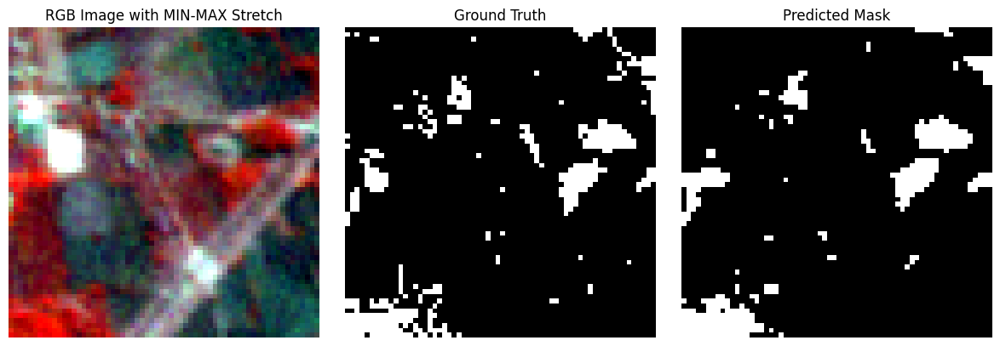

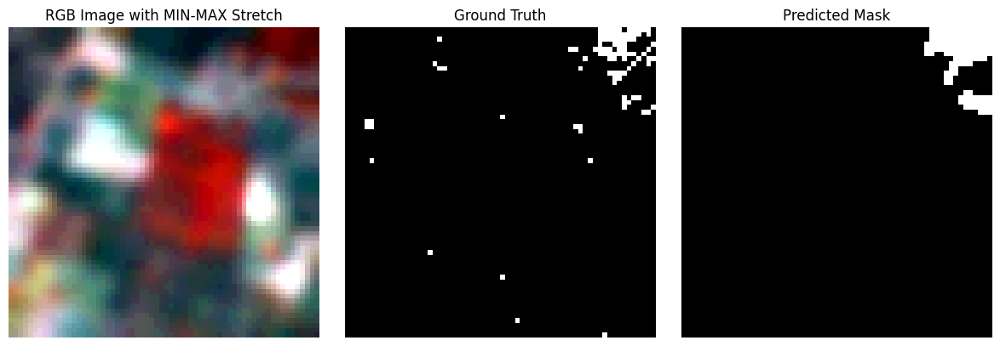

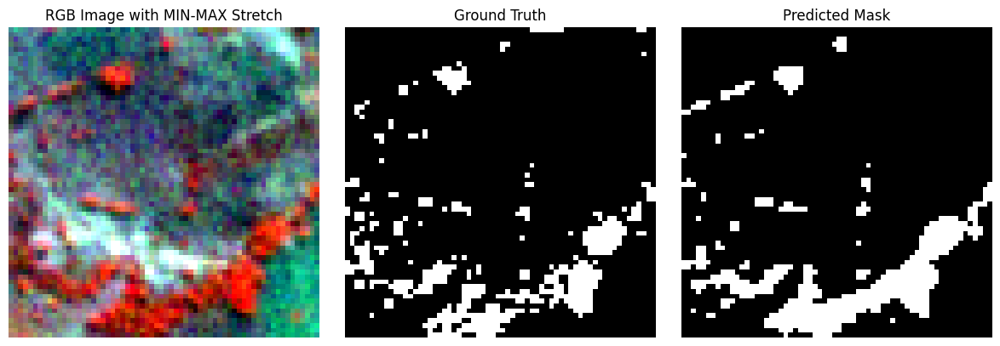

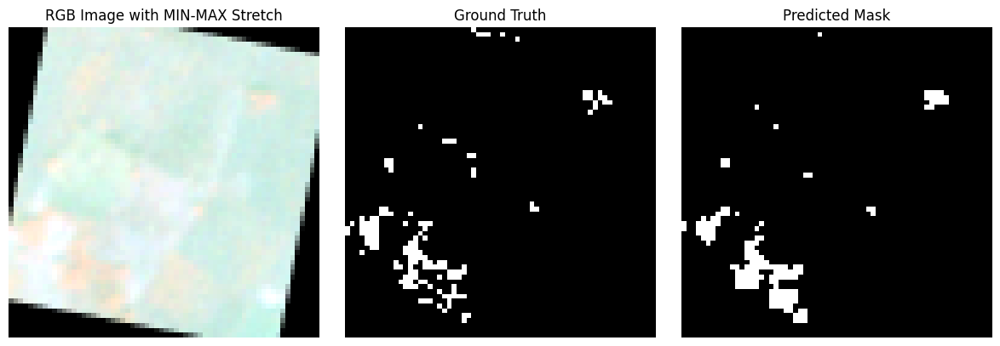

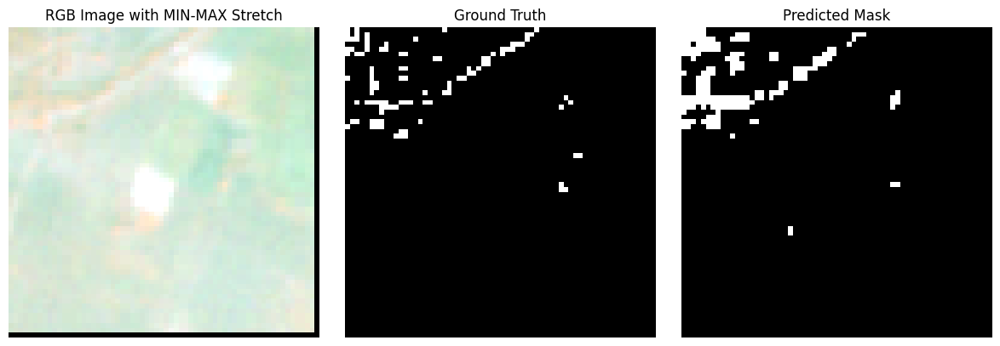

...

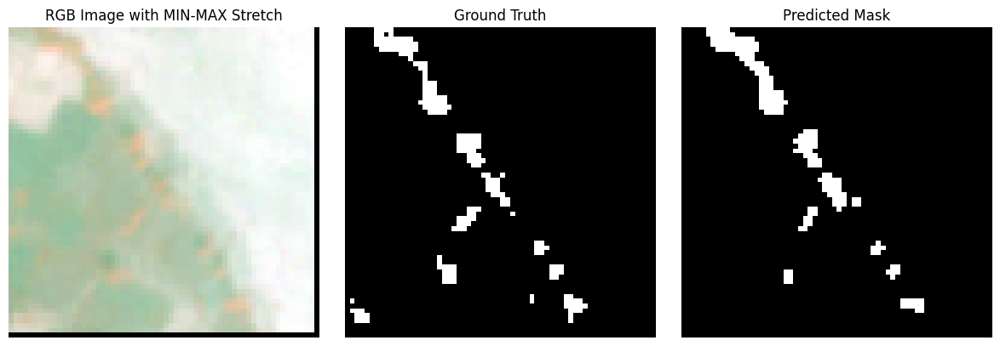

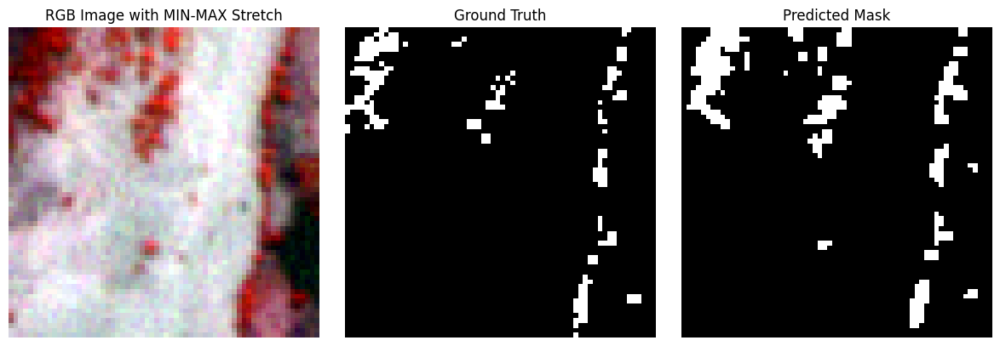

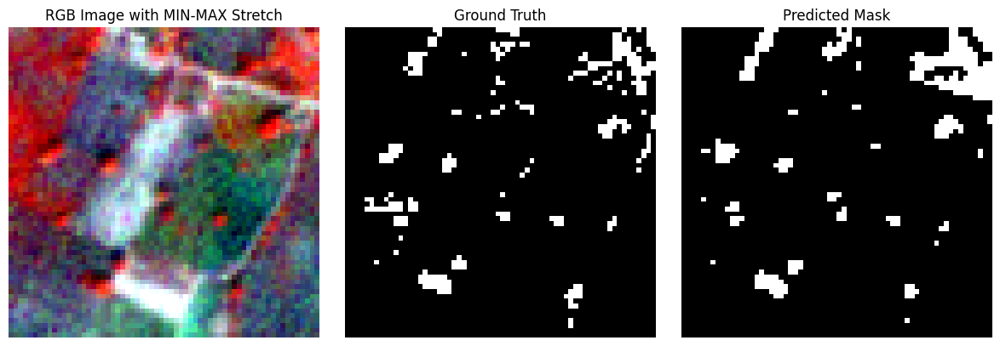

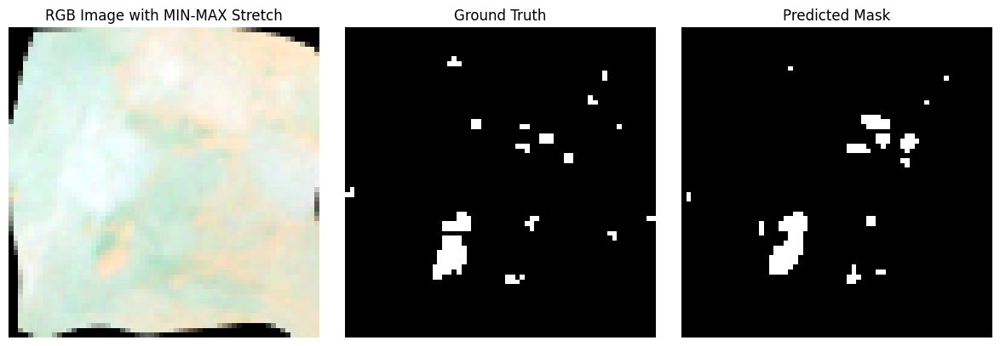

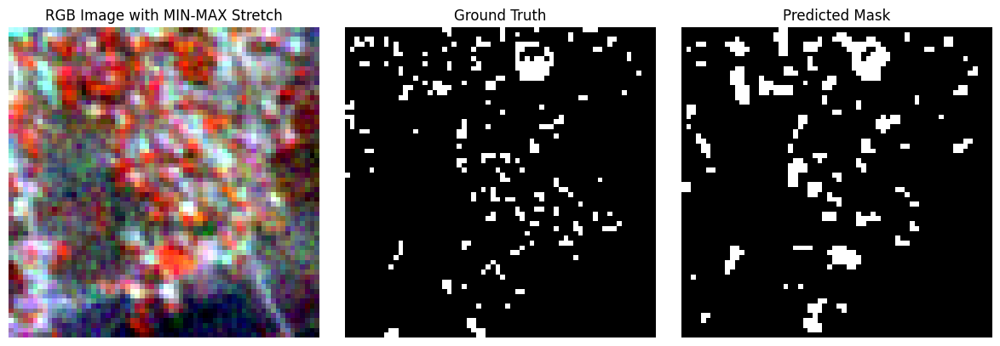

In [20]:
visualize_fixed_predictions(model, fixed_imgs, fixed_masks)

## Analysis on the Model :

### Model Error Analysis & Visualization

1. Converts images from (NIR, R, G) to RGB with min-max normalization for clear visualization.
2. Generates binary predictions from model outputs using a 0.5 threshold.
3. Computes error maps and identifies connected components (blobs) to quantify isolated vs larger errors.
4. Visualizes original image, ground truth, predicted mask, and error map side by side.
5. Plots a histogram of error region sizes to understand the distribution of misclassified areas.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


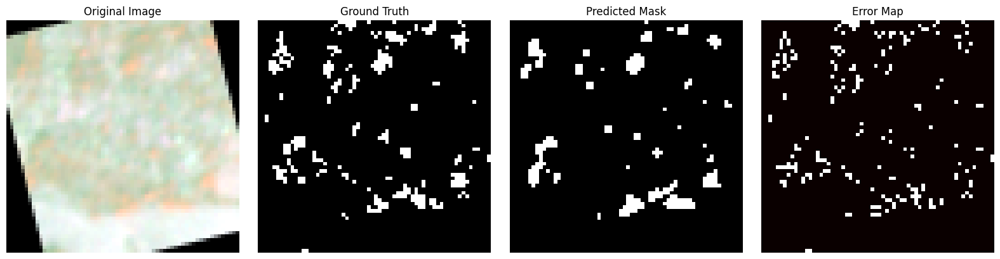

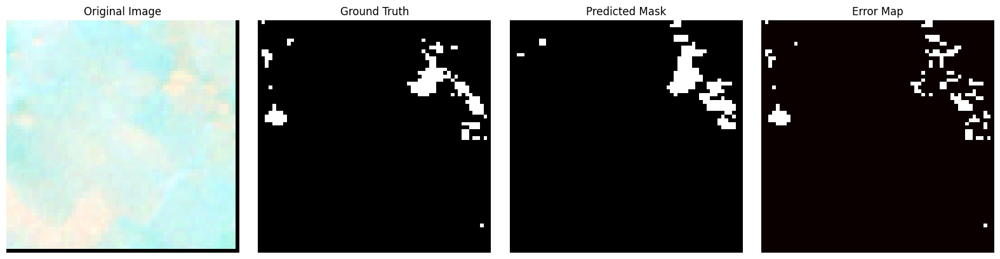

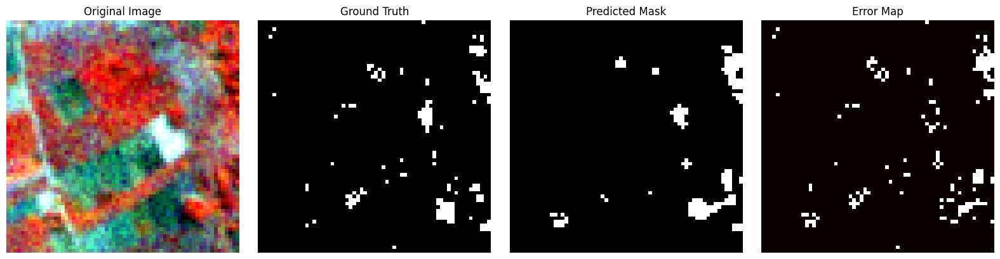

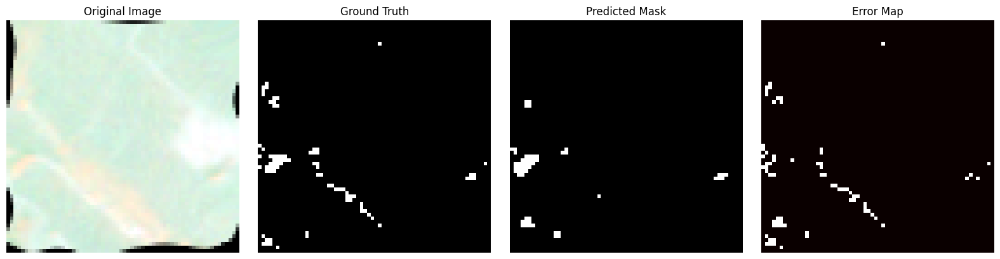

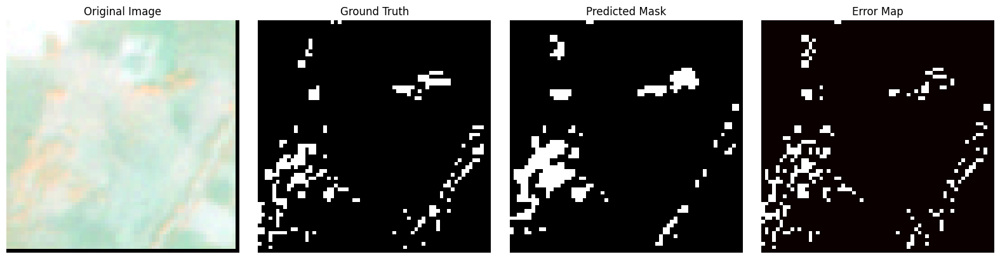

...

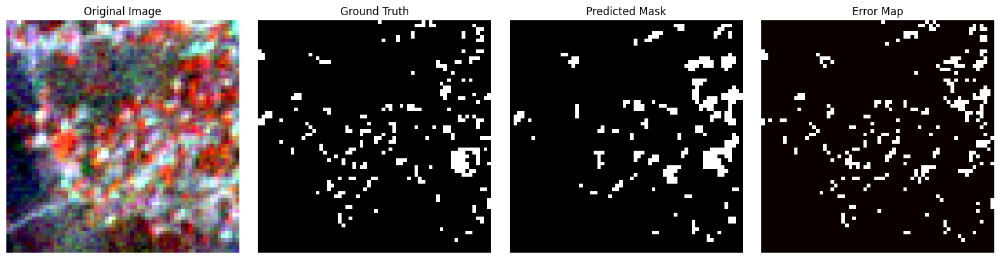

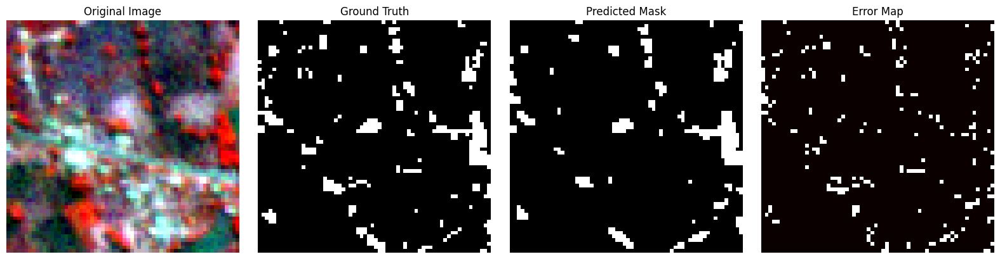

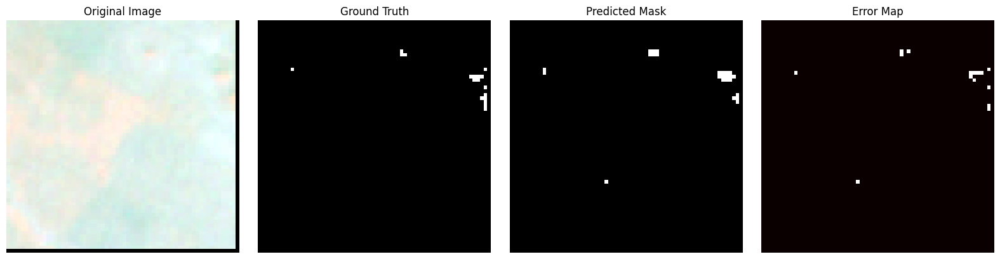

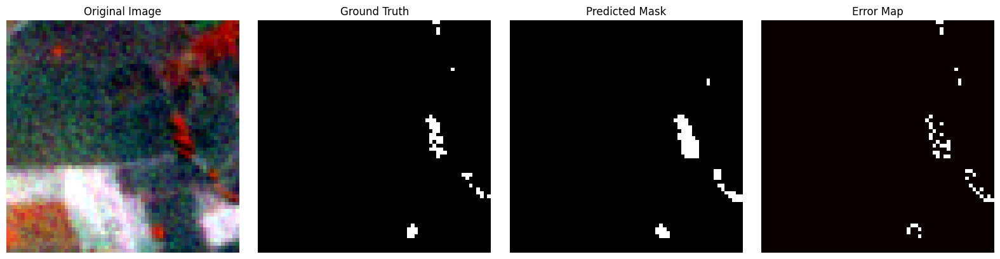

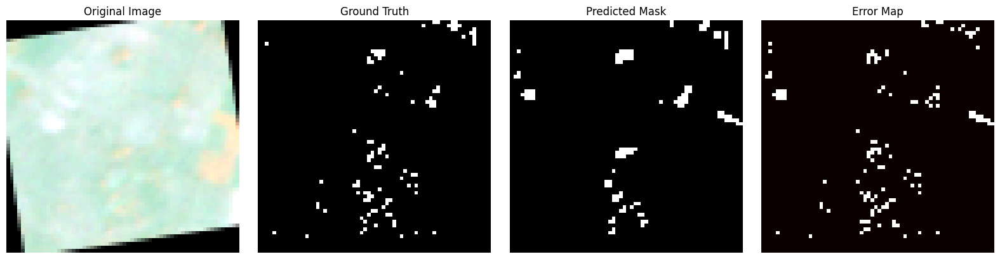


Bin 0 (1 pixel):
  Total error blobs: 494
  Avg size of blobs: 1.00 pixels

Bin 1 (2-5 pixels):
  Total error blobs: 337
  Avg size of blobs: 2.82 pixels

Bin 2 (6-10 pixels):
  Total error blobs: 35
  Avg size of blobs: 7.57 pixels

Bin 3 (>10 pixels):
  Total error blobs: 19
  Avg size of blobs: 15.26 pixels


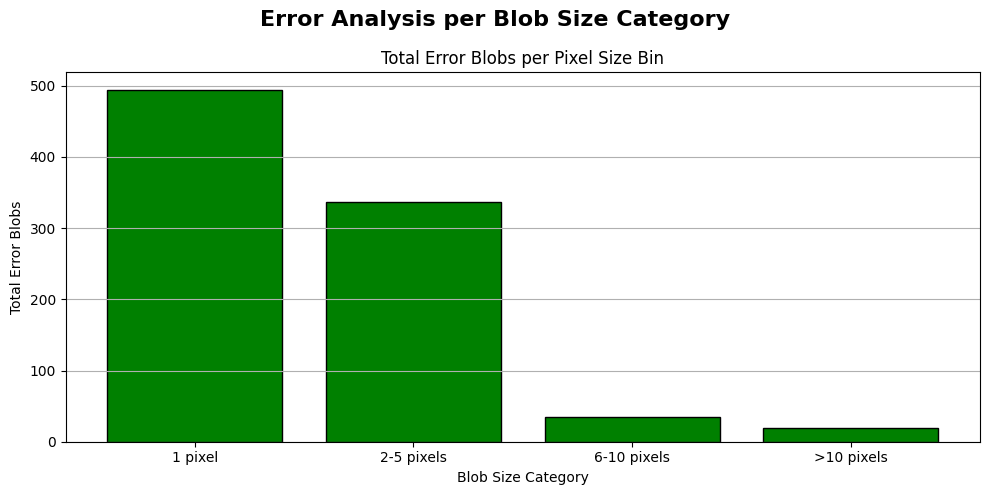

In [21]:
import numpy as np
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt

# --- Function to convert (NIR, R, G) to RGB with min-max stretch ---
def convert_to_rgb(img):
    rgb = img[..., [1, 2, 0]].astype(np.float32)  # reorder to (R, G, NIR)
    for c in range(3):
        band = rgb[..., c]
        rgb[..., c] = (band - band.min()) / (band.max() - band.min() + 1e-8)
    return rgb

# --- Define bins based on blob size (pixels) ---
bins = [(1, 1), (2, 5), (6, 10), (11, np.inf)]
bin_labels = ["1 pixel", "2-5 pixels", "6-10 pixels", ">10 pixels"]

# --- Stats per bin ---
bin_stats = {i: {"total_blobs": 0, "blob_sizes": []} for i in range(len(bins))}

# --- Fetch a batch from test generator ---
test_images, test_masks = test_gen[1]

# --- Predict on the batch ---
preds = model.predict(test_images)
preds = (preds > 0.5).astype(np.uint8)

# --- Visualize and analyze ---
for j in range(len(test_images)):
    gt = test_masks[j].squeeze().astype(np.uint8)
    pr = preds[j].squeeze().astype(np.uint8)

    # === Binary Error Map ===
    error_map = (pr != gt).astype(np.uint8)

    # === Connected Components ===
    labeled = label(error_map, connectivity=1)
    regions = regionprops(labeled)

    for region in regions:
        size = region.area

        # Assign bin by size
        for b, (low, high) in enumerate(bins):
            if low <= size <= high:
                bin_stats[b]["blob_sizes"].append(size)
                bin_stats[b]["total_blobs"] += 1
                break

    # === Visualization with RGB Original Image ===
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 4, 1)
    plt.imshow(convert_to_rgb(test_images[j]))   # ✅ use your function here
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(gt, cmap='gray')
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(pr, cmap='gray')
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.subplot(1, 4, 4)
    plt.imshow(error_map, cmap='hot')
    plt.title("Error Map")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# --- Print Summary per bin ---
for b, label_name in enumerate(bin_labels):
    stats = bin_stats[b]
    total_blobs = stats["total_blobs"]
    print(f"\nBin {b} ({label_name}):")
    print(f"  Total error blobs: {total_blobs}")
    if total_blobs > 0:
        avg_size = np.mean(stats["blob_sizes"])
        print(f"  Avg size of blobs: {avg_size:.2f} pixels")
    else:
        print("  No error blobs in this bin.")

# --- Histogram: total error blobs per size bin ---
bin_totals = [bin_stats[b]["total_blobs"] for b in range(len(bins))]

plt.figure(figsize=(10,5))
plt.suptitle("Error Analysis per Blob Size Category", fontsize=16, fontweight="bold")  # <-- Added graph name
plt.bar(bin_labels, bin_totals, color='green', edgecolor='black')
plt.title("Total Error Blobs per Pixel Size Bin")
plt.xlabel("Blob Size Category")
plt.ylabel("Total Error Blobs")
plt.grid(axis='y')

plt.tight_layout()
plt.show()


### Vegetation Cover Fraction (VCF) Analysis at Block Level :

This block of code evaluates the model’s predictions by analyzing Vegetation Cover Fraction (VCF) at a fixed grid scale (20×20 pixels ≈ 100m).

1. First, the VCF is computed for both ground truth masks and predicted masks by dividing the image into smaller blocks and calculating the fraction of vegetation in each block.
2. Histograms are plotted to compare the distribution of VCF values between ground truth and predictions.
3. Statistical metrics such as Root Mean Squared Error (RMSE), R² score, and Bias are calculated to measure prediction accuracy.
4. Finally, a scatter plot is created to visualize the correlation between predicted and true VCF values, along with an ideal reference line (y = x) for perfect agreement.
5. This helps assess how well the segmentation model captures vegetation density patterns at a coarser spatial resolution.

#### On Validation Set :

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


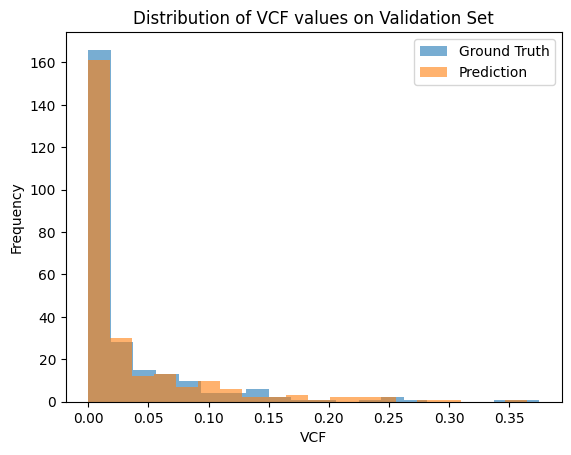


VCF Evaluation Metrics Table:
Metric    Value
  RMSE 0.025285
    R² 0.797022
  Bias 0.003730


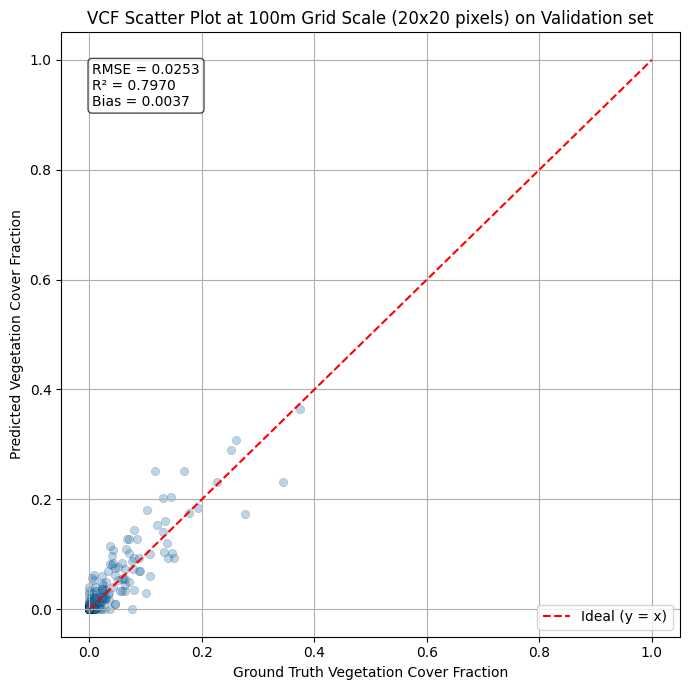

In [22]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

# --- VCF Calculation Function ---
def compute_vcf_blocks(mask, block_size=20):
    H, W = mask.shape
    vcf_blocks = []

    for i in range(0, H, block_size):
        for j in range(0, W, block_size):
            block = mask[i:i+block_size, j:j+block_size]
            fraction = np.sum(block) / (block_size * block_size)
            vcf_blocks.append(fraction)

    return vcf_blocks  # returns list of VCFs per block


# --- Fetch a batch from validation generator ---
val_images, val_masks = val_gen[0]  # shape: (batch, H, W, C)

# --- Predict ---
preds = model.predict(val_images)
preds = (preds > 0.5).astype(np.uint8)

# --- Initialize lists to collect all VCFs ---
all_gt_vcf = []
all_pred_vcf = []

# --- Loop over each image in batch ---
for j in range(len(val_images)):
    gt = val_masks[j].squeeze().astype(np.uint8)
    pr = preds[j].squeeze().astype(np.uint8)

    # Compute vegetation cover fractions (VCF) per 20x20 block
    gt_vcf = compute_vcf_blocks(gt, block_size=20)
    pr_vcf = compute_vcf_blocks(pr, block_size=20)

    # Collect results
    all_gt_vcf.extend(gt_vcf)
    all_pred_vcf.extend(pr_vcf)

# --- Convert to numpy arrays ---
all_gt_vcf = np.array(all_gt_vcf)
all_pred_vcf = np.array(all_pred_vcf)

# --- Plot Histograms ---
plt.hist(all_gt_vcf, bins=20, alpha=0.6, label='Ground Truth')
plt.hist(all_pred_vcf, bins=20, alpha=0.6, label='Prediction')
plt.xlabel("VCF")
plt.ylabel("Frequency")
plt.legend()
plt.title("Distribution of VCF values on Validation Set")
plt.show()

# --- Compute Metrics ---
rmse = np.sqrt(mean_squared_error(all_gt_vcf, all_pred_vcf))
r2 = r2_score(all_gt_vcf, all_pred_vcf)
bias = np.mean(all_pred_vcf - all_gt_vcf)

# --- Print Metrics as Console Table ---
metrics_table = pd.DataFrame({
    "Metric": ["RMSE", "R²", "Bias"],
    "Value": [rmse, r2, bias]
})
print("\nVCF Evaluation Metrics Table:")
print(metrics_table.to_string(index=False))

# --- Scatter Plot with Metrics as Text ---
plt.figure(figsize=(7, 7))
plt.scatter(all_gt_vcf, all_pred_vcf, alpha=0.3, edgecolor='k', linewidth=0.3)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal (y = x)')
plt.xlabel("Ground Truth Vegetation Cover Fraction")
plt.ylabel("Predicted Vegetation Cover Fraction")
plt.title("VCF Scatter Plot at 100m Grid Scale (20x20 pixels) on Validation set")
plt.grid(True)
plt.legend()

# --- Add metrics as text on the figure (near ideal line) ---
textstr = '\n'.join((
    f'RMSE = {rmse:.4f}',
    f'R² = {r2:.4f}',
    f'Bias = {bias:.4f}',
))
plt.gca().text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
               fontsize=10, verticalalignment='top',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

plt.tight_layout()
plt.show()

100%|██████████| 15/15 [00:02<00:00,  6.72it/s]


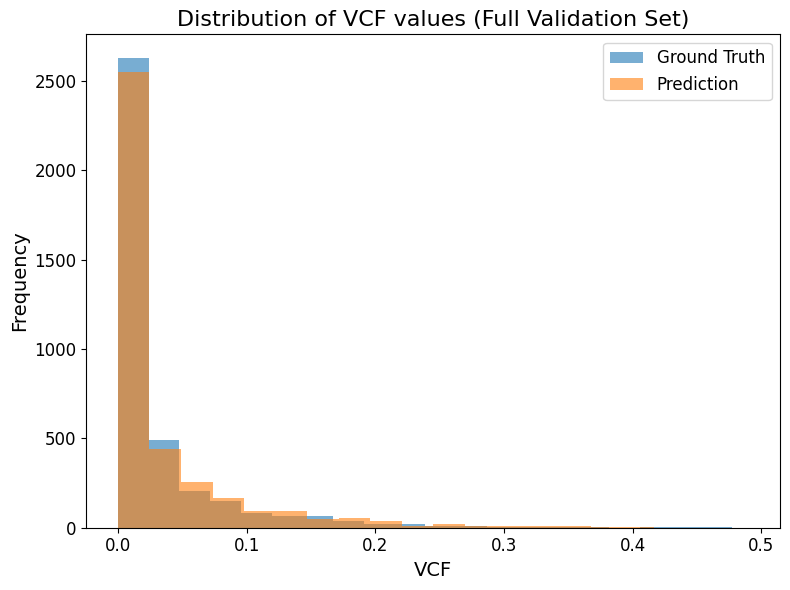


VCF Evaluation Metrics Table (Full Validation Set):
Metric    Value
  RMSE 0.025310
    R² 0.774668
  Bias 0.003592


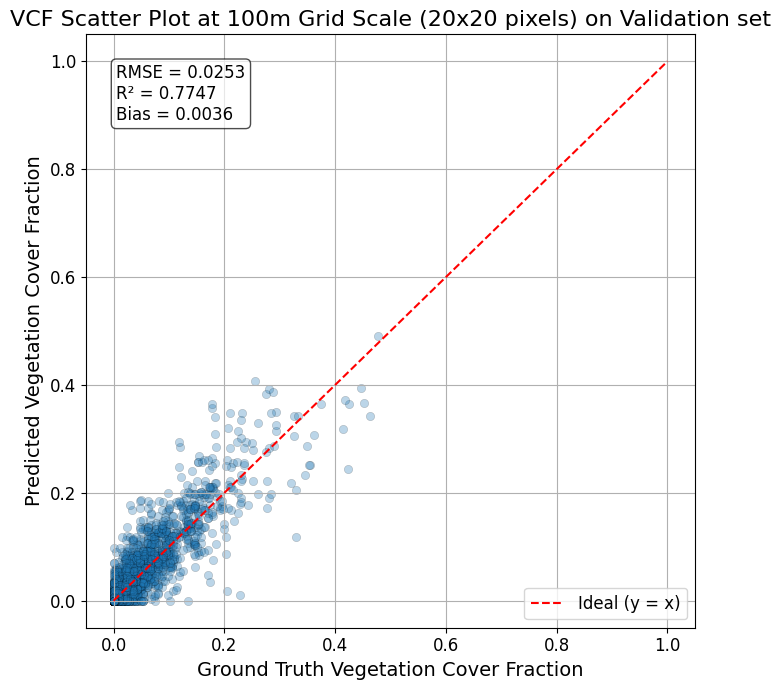

In [22]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
from tqdm import tqdm

# --- VCF Calculation Function ---
def compute_vcf_blocks(mask, block_size=20):
    H, W = mask.shape
    vcf_blocks = []

    for i in range(0, H, block_size):
        for j in range(0, W, block_size):
            block = mask[i:i+block_size, j:j+block_size]
            fraction = np.sum(block) / (block_size * block_size)
            vcf_blocks.append(fraction)

    return vcf_blocks  # returns list of VCFs per block


# --- Initialize lists to collect all VCFs ---
all_gt_vcf = []
all_pred_vcf = []

# --- Loop over all validation batches ---
for i in tqdm(range(len(val_gen))):
    X_batch, y_batch = val_gen[i]
    preds = model.predict(X_batch, verbose=0)
    preds = (preds > 0.5).astype(np.uint8)

    for j in range(len(X_batch)):
        gt = y_batch[j].squeeze().astype(np.uint8)
        pr = preds[j].squeeze().astype(np.uint8)

        # Compute VCF per 20x20 block
        gt_vcf = compute_vcf_blocks(gt, block_size=20)
        pr_vcf = compute_vcf_blocks(pr, block_size=20)

        # Collect results
        all_gt_vcf.extend(gt_vcf)
        all_pred_vcf.extend(pr_vcf)

# --- Convert to numpy arrays ---
all_gt_vcf = np.array(all_gt_vcf)
all_pred_vcf = np.array(all_pred_vcf)

# --- Plot Histograms ---
plt.figure(figsize=(8,6))
plt.hist(all_gt_vcf, bins=20, alpha=0.6, label='Ground Truth')
plt.hist(all_pred_vcf, bins=20, alpha=0.6, label='Prediction')
plt.xlabel("VCF", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.legend(fontsize=12)
plt.title("Distribution of VCF values (Full Validation Set)", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

# --- Compute Metrics ---
rmse = np.sqrt(mean_squared_error(all_gt_vcf, all_pred_vcf))
r2 = r2_score(all_gt_vcf, all_pred_vcf)
bias = np.mean(all_pred_vcf - all_gt_vcf)

# --- Print Metrics as Console Table ---
metrics_table = pd.DataFrame({
    "Metric": ["RMSE", "R²", "Bias"],
    "Value": [rmse, r2, bias]
})
print("\nVCF Evaluation Metrics Table (Full Validation Set):")
print(metrics_table.to_string(index=False))

# --- Scatter Plot with Metrics as Text ---
plt.figure(figsize=(7, 7))
plt.scatter(all_gt_vcf, all_pred_vcf, alpha=0.3, edgecolor='k', linewidth=0.3)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal (y = x)')
plt.xlabel("Ground Truth Vegetation Cover Fraction", fontsize=14)
plt.ylabel("Predicted Vegetation Cover Fraction", fontsize=14)
plt.title("VCF Scatter Plot at 100m Grid Scale (20x20 pixels) on Validation set", fontsize=16)
plt.grid(True)
plt.legend(fontsize=12)

# --- Add metrics as text on the figure (larger font) ---
textstr = '\n'.join((
    f'RMSE = {rmse:.4f}',
    f'R² = {r2:.4f}',
    f'Bias = {bias:.4f}',
))
plt.gca().text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
               fontsize=12, verticalalignment='top',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

#### On Test Set

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step


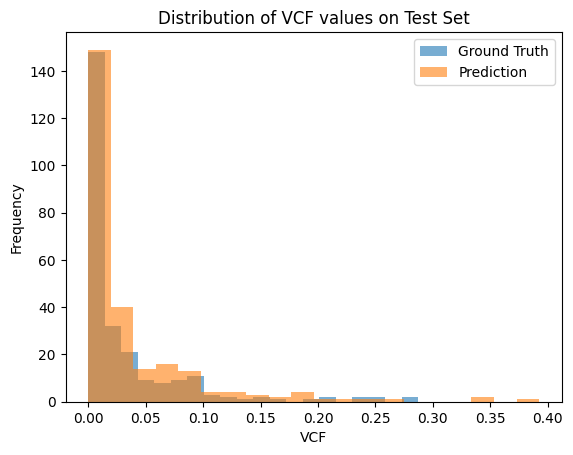


VCF Evaluation Metrics Table :
Metric    Value
  RMSE 0.037456
    R² 0.489475
  Bias 0.004277


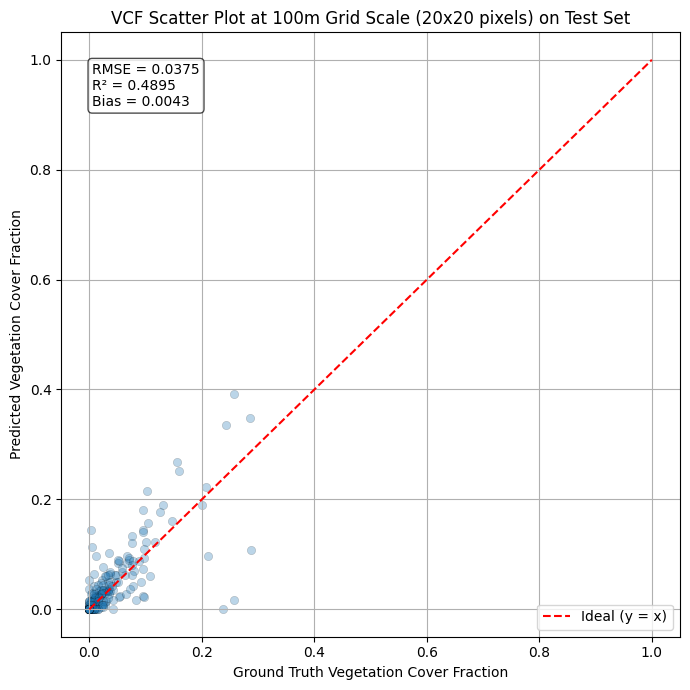

In [24]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

# --- VCF Calculation Function ---
def compute_vcf_blocks(mask, block_size=20):
    H, W = mask.shape
    vcf_blocks = []

    for i in range(0, H, block_size):
        for j in range(0, W, block_size):
            block = mask[i:i+block_size, j:j+block_size]
            fraction = np.sum(block) / (block_size * block_size)
            vcf_blocks.append(fraction)

    return vcf_blocks  # returns list of VCFs per block


# --- Fetch a batch from validation generator ---
val_images, val_masks = test_gen[0]  # shape: (batch, H, W, C)

# --- Predict ---
preds = model.predict(val_images)
preds = (preds > 0.5).astype(np.uint8)

# --- Initialize lists to collect all VCFs ---
all_gt_vcf = []
all_pred_vcf = []

# --- Loop over each image in batch ---
for j in range(len(val_images)):
    gt = val_masks[j].squeeze().astype(np.uint8)
    pr = preds[j].squeeze().astype(np.uint8)

    # Compute vegetation cover fractions (VCF) per 20x20 block
    gt_vcf = compute_vcf_blocks(gt, block_size=20)
    pr_vcf = compute_vcf_blocks(pr, block_size=20)

    # Collect results
    all_gt_vcf.extend(gt_vcf)
    all_pred_vcf.extend(pr_vcf)

# --- Convert to numpy arrays ---
all_gt_vcf = np.array(all_gt_vcf)
all_pred_vcf = np.array(all_pred_vcf)

# --- Plot Histograms ---
plt.hist(all_gt_vcf, bins=20, alpha=0.6, label='Ground Truth')
plt.hist(all_pred_vcf, bins=20, alpha=0.6, label='Prediction')
plt.xlabel("VCF")
plt.ylabel("Frequency")
plt.legend()
plt.title("Distribution of VCF values on Test Set")
plt.show()

# --- Compute Metrics ---
rmse = np.sqrt(mean_squared_error(all_gt_vcf, all_pred_vcf))
r2 = r2_score(all_gt_vcf, all_pred_vcf)
bias = np.mean(all_pred_vcf - all_gt_vcf)

# --- Print Metrics as Console Table ---
metrics_table = pd.DataFrame({
    "Metric": ["RMSE", "R²", "Bias"],
    "Value": [rmse, r2, bias]
})
print("\nVCF Evaluation Metrics Table :")
print(metrics_table.to_string(index=False))

# --- Scatter Plot with Metrics as Text ---
plt.figure(figsize=(7, 7))
plt.scatter(all_gt_vcf, all_pred_vcf, alpha=0.3, edgecolor='k', linewidth=0.3)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal (y = x)')
plt.xlabel("Ground Truth Vegetation Cover Fraction")
plt.ylabel("Predicted Vegetation Cover Fraction")
plt.title("VCF Scatter Plot at 100m Grid Scale (20x20 pixels) on Test Set")
plt.grid(True)
plt.legend()

# --- Add metrics as text on the figure (near ideal line) ---
textstr = '\n'.join((
    f'RMSE = {rmse:.4f}',
    f'R² = {r2:.4f}',
    f'Bias = {bias:.4f}',
))
plt.gca().text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
               fontsize=10, verticalalignment='top',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

plt.tight_layout()
plt.show()

100%|██████████| 15/15 [00:02<00:00,  6.77it/s]


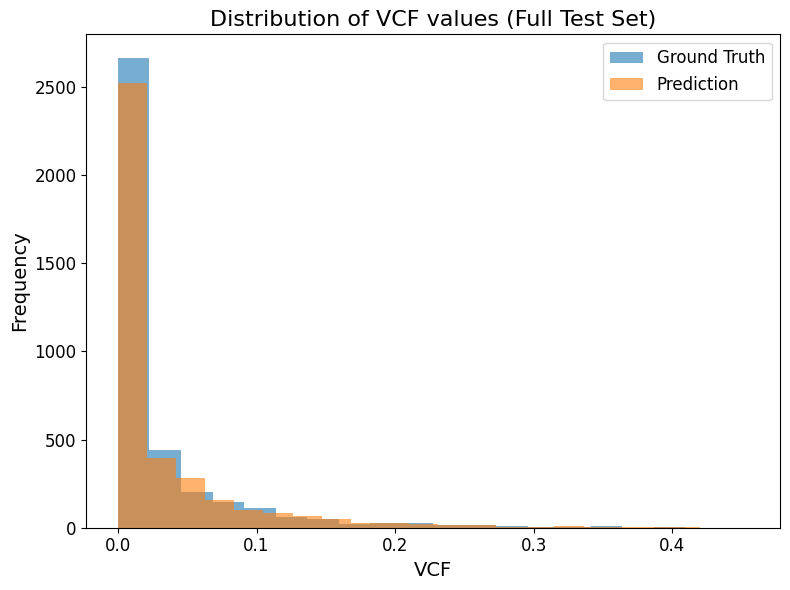


VCF Evaluation Metrics Table (Full Test Set):
Metric    Value
  RMSE 0.027588
    R² 0.724340
  Bias 0.003420


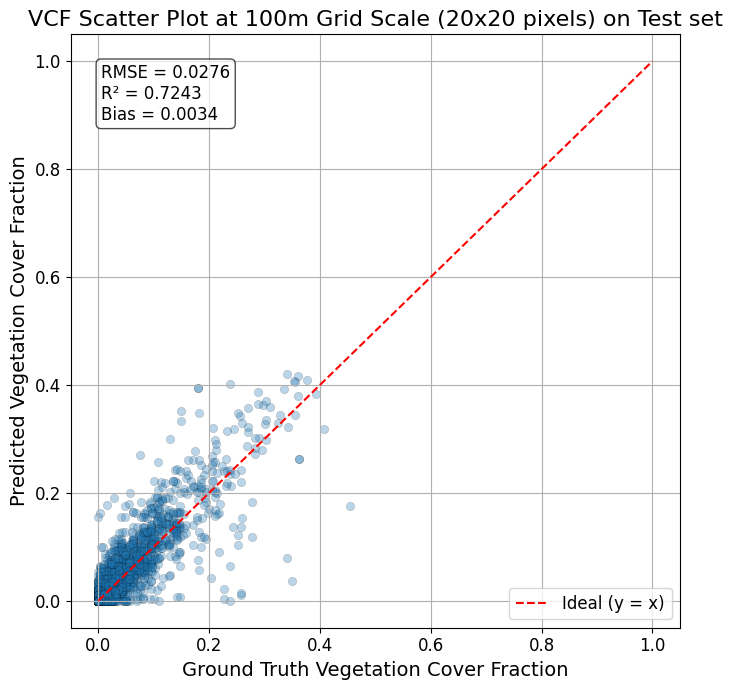

In [23]:
# --- Imports ---
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
from tqdm import tqdm

# --- VCF Calculation Function ---
def compute_vcf_blocks(mask, block_size=20):
    H, W = mask.shape
    vcf_blocks = []

    for i in range(0, H, block_size):
        for j in range(0, W, block_size):
            block = mask[i:i+block_size, j:j+block_size]
            fraction = np.sum(block) / (block_size * block_size)
            vcf_blocks.append(fraction)

    return vcf_blocks  # returns list of VCFs per block


# --- Initialize lists to collect all VCFs ---
all_gt_vcf = []
all_pred_vcf = []

# --- Loop over all validation batches ---
for i in tqdm(range(len(test_gen))):
    X_batch, y_batch = test_gen[i]
    preds = model.predict(X_batch, verbose=0)
    preds = (preds > 0.5).astype(np.uint8)

    for j in range(len(X_batch)):
        gt = y_batch[j].squeeze().astype(np.uint8)
        pr = preds[j].squeeze().astype(np.uint8)

        # Compute VCF per 20x20 block
        gt_vcf = compute_vcf_blocks(gt, block_size=20)
        pr_vcf = compute_vcf_blocks(pr, block_size=20)

        # Collect results
        all_gt_vcf.extend(gt_vcf)
        all_pred_vcf.extend(pr_vcf)

# --- Convert to numpy arrays ---
all_gt_vcf = np.array(all_gt_vcf)
all_pred_vcf = np.array(all_pred_vcf)

# --- Plot Histograms ---
plt.figure(figsize=(8,6))
plt.hist(all_gt_vcf, bins=20, alpha=0.6, label='Ground Truth')
plt.hist(all_pred_vcf, bins=20, alpha=0.6, label='Prediction')
plt.xlabel("VCF", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.legend(fontsize=12)
plt.title("Distribution of VCF values (Full Test Set)", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

# --- Compute Metrics ---
rmse = np.sqrt(mean_squared_error(all_gt_vcf, all_pred_vcf))
r2 = r2_score(all_gt_vcf, all_pred_vcf)
bias = np.mean(all_pred_vcf - all_gt_vcf)

# --- Print Metrics as Console Table ---
metrics_table = pd.DataFrame({
    "Metric": ["RMSE", "R²", "Bias"],
    "Value": [rmse, r2, bias]
})
print("\nVCF Evaluation Metrics Table (Full Test Set):")
print(metrics_table.to_string(index=False))

# --- Scatter Plot with Metrics as Text ---
plt.figure(figsize=(7, 7))
plt.scatter(all_gt_vcf, all_pred_vcf, alpha=0.3, edgecolor='k', linewidth=0.3)
plt.plot([0, 1], [0, 1], 'r--', label='Ideal (y = x)')
plt.xlabel("Ground Truth Vegetation Cover Fraction", fontsize=14)
plt.ylabel("Predicted Vegetation Cover Fraction", fontsize=14)
plt.title("VCF Scatter Plot at 100m Grid Scale (20x20 pixels) on Test set", fontsize=16)
plt.grid(True)
plt.legend(fontsize=12)

# --- Add metrics as text on the figure (larger font) ---
textstr = '\n'.join((
    f'RMSE = {rmse:.4f}',
    f'R² = {r2:.4f}',
    f'Bias = {bias:.4f}',
))
plt.gca().text(0.05, 0.95, textstr, transform=plt.gca().transAxes,
               fontsize=12, verticalalignment='top',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

### Small Object Detectability Analysis (1-2 Pixel Structures) :

This block of code focuses on analyzing the model’s ability to detect very small objects (1–2 pixel regions) in the segmentation task.

1. The trained model is first loaded, and predictions are generated on both the validation and test datasets.
2. Otsu thresholding is applied to convert the predicted probability maps into binary masks.
3. Using connected component analysis, ground-truth objects of size 1–2 pixels are identified, and their detectability is categorized as fully detected, partially detected, or missed.
4. Detailed statistics are collected across all patches, and a summary report is produced for each dataset.
5. This evaluation helps measure how well the model captures fine-grained details and tiny structures, which are often critical in high-resolution satellite imagery analysis.

In [26]:
import numpy as np
import tensorflow as tf
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
from tqdm import tqdm

In [27]:
# paths 
model_path = "/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/programs/notebooks/Current_working_codes/best_tversky_loss.h5"

# Load model
model = tf.keras.models.load_model(model_path, compile=False)

# Helper: Get connected component masks of size n pixels
def get_components_of_size(mask, size_list=[1, 2]):
    """
    Returns list of (component_mask, size) for all components whose size is in size_list
    """
    labeled = label(mask)
    small_components = []
    for region in regionprops(labeled):
        if region.area in size_list:
            coords = region.coords
            comp_mask = np.zeros_like(mask, dtype=np.uint8)
            comp_mask[coords[:,0], coords[:,1]] = 1
            small_components.append((comp_mask, region.area))
    return small_components

#### On Validation Set

In [28]:
# Evaluation on Validation set
results = []

for i in tqdm(range(len(val_gen))):
    X_batch, y_batch = val_gen[i]
    
    # Model predictions
    preds = model.predict(X_batch, verbose=0)
    
    for img_idx in range(len(X_batch)):
        gt = y_batch[img_idx, ..., 0]  # (64, 64)
        pred = preds[img_idx, ..., 0]  # (64, 64)

        # Otsu thresholding
        try:
            t = threshold_otsu(pred)
        except:
            t = 0.5  # fallback
        bin_pred = (pred >= t).astype(np.uint8)

        # Get small GT objects (1 or 2 pixels)
        small_gt_components = get_components_of_size(gt, size_list=[1,2])

        # For stats
        fully, partial, missed = 0, 0, 0

        for comp_mask, area in small_gt_components:
            overlap = np.sum(comp_mask * bin_pred)
            if overlap == area:
                fully += 1
            elif overlap > 0:
                partial += 1
            else:
                missed += 1

        results.append({
            "image_index": i * val_gen.batch_size + img_idx,
            "total_small_objs": len(small_gt_components),
            "fully_detected": fully,
            "partially_detected": partial,
            "missed": missed
        })

# Summary 
total_objs = sum(r["total_small_objs"] for r in results)
total_full = sum(r["fully_detected"] for r in results)
total_part = sum(r["partially_detected"] for r in results)
total_miss = sum(r["missed"] for r in results)

print("\n==== Small Object Detectability Report ====")
print(f"Total small (1-2 px) objects: {total_objs}")
print(f"Fully detected:   {total_full} ({(total_full/total_objs)*100:.2f}%)")
print(f"Partially detected: {total_part} ({(total_part/total_objs)*100:.2f}%)")
print(f"Missed:            {total_miss} ({(total_miss/total_objs)*100:.2f}%)")

100%|██████████| 15/15 [00:03<00:00,  4.06it/s]


==== Small Object Detectability Report ====
Total small (1-2 px) objects: 3789
Fully detected:   977 (25.79%)
Partially detected: 253 (6.68%)
Missed:            2559 (67.54%)


#### On the Test Set 

In [29]:
# Evaluation on Test Set
results = []

for i in tqdm(range(len(test_gen))):
    X_batch, y_batch = test_gen[i]
    
    # Model predictions
    preds = model.predict(X_batch, verbose=0)
    
    for img_idx in range(len(X_batch)):
        gt = y_batch[img_idx, ..., 0]  # (64, 64)
        pred = preds[img_idx, ..., 0]  # (64, 64)

        # Otsu thresholding
        try:
            t = threshold_otsu(pred)
        except:
            t = 0.5  # fallback
        bin_pred = (pred >= t).astype(np.uint8)

        # Get small GT objects (1 or 2 pixels)
        small_gt_components = get_components_of_size(gt, size_list=[1,2])

        # For stats
        fully, partial, missed = 0, 0, 0

        for comp_mask, area in small_gt_components:
            overlap = np.sum(comp_mask * bin_pred)
            if overlap == area:
                fully += 1
            elif overlap > 0:
                partial += 1
            else:
                missed += 1

        results.append({
            "image_index": i * val_gen.batch_size + img_idx,
            "total_small_objs": len(small_gt_components),
            "fully_detected": fully,
            "partially_detected": partial,
            "missed": missed
        })

# Summary 
total_objs = sum(r["total_small_objs"] for r in results)
total_full = sum(r["fully_detected"] for r in results)
total_part = sum(r["partially_detected"] for r in results)
total_miss = sum(r["missed"] for r in results)

print("\n==== Small Object Detectability Report ====")
print(f"Total small (1-2 px) objects: {total_objs}")
print(f"Fully detected:   {total_full} ({(total_full/total_objs)*100:.2f}%)")
print(f"Partially detected: {total_part} ({(total_part/total_objs)*100:.2f}%)")
print(f"Missed:            {total_miss} ({(total_miss/total_objs)*100:.2f}%)")

100%|██████████| 15/15 [00:02<00:00,  6.75it/s]


==== Small Object Detectability Report ====
Total small (1-2 px) objects: 3611
Fully detected:   820 (22.71%)
Partially detected: 239 (6.62%)
Missed:            2552 (70.67%)


### Medium & Large Object Detectability Analysis :

This block of code evaluates how well the segmentation model detects medium-sized objects (3–5 pixels) and large objects (≥6 pixels) in the validation set.

#### On the Validation Set

In [30]:
# On the Validation Set

from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
import numpy as np
from tqdm import tqdm

# Utility to get connected components by size range
def get_components_by_size(mask, min_size=None, max_size=None):
    labeled = label(mask)
    components = []
    for region in regionprops(labeled):
        area = region.area
        if (min_size is None or area >= min_size) and (max_size is None or area <= max_size):
            comp_mask = (labeled == region.label).astype(np.uint8)
            components.append((comp_mask, area))
    return components

# Collect results
results_medium = []
results_large = []

for i in tqdm(range(len(val_gen))):
    X_batch, y_batch = val_gen[i]
    preds = model.predict(X_batch, verbose=0)

    for img_idx in range(len(X_batch)):
        gt = y_batch[img_idx, ..., 0]      # Ground truth mask
        pred = preds[img_idx, ..., 0]      # Predicted probability map

        # Otsu thresholding
        try:
            t = threshold_otsu(pred)
        except:
            t = 0.5
        bin_pred = (pred >= t).astype(np.uint8)

        # Split GT objects by size
        medium_gt = get_components_by_size(gt, min_size=3, max_size=5)
        large_gt = get_components_by_size(gt, min_size=6, max_size=None)

        # Evaluate
        def evaluate(components):
            full = part = miss = 0
            for comp_mask, area in components:
                overlap = np.sum(comp_mask * bin_pred)
                if overlap == area:
                    full += 1
                elif overlap > 0:
                    part += 1
                else:
                    miss += 1
            return full, part, miss

        f_m, p_m, m_m = evaluate(medium_gt)
        f_l, p_l, m_l = evaluate(large_gt)

        results_medium.append({"total": len(medium_gt), "full": f_m, "part": p_m, "miss": m_m})
        results_large.append({"total": len(large_gt), "full": f_l, "part": p_l, "miss": m_l})

# Summarize results
def summarize(results, label):
    total = sum(r["total"] for r in results)
    full = sum(r["full"] for r in results)
    part = sum(r["part"] for r in results)
    miss = sum(r["miss"] for r in results)

    if total > 0:
        print(f"\n==== {label} Object Detectability Report ====")
        print(f"Total {label.lower()} objects: {total}")
        print(f"Fully detected:   {full} ({(full/total)*100:.2f}%)")
        print(f"Partially detected: {part} ({(part/total)*100:.2f}%)")
        print(f"Missed:            {miss} ({(miss/total)*100:.2f}%)")
    else:
        print(f"\n==== {label} Object Detectability Report ====")
        print("No objects found in ground truth.")

summarize(results_medium, "Medium (3–5 px)")
summarize(results_large, "Large (≥6 px)")

100%|██████████| 15/15 [00:02<00:00,  6.68it/s]


==== Medium (3–5 px) Object Detectability Report ====
Total medium (3–5 px) objects: 1576
Fully detected:   474 (30.08%)
Partially detected: 676 (42.89%)
Missed:            426 (27.03%)

==== Large (≥6 px) Object Detectability Report ====
Total large (≥6 px) objects: 1656
Fully detected:   254 (15.34%)
Partially detected: 1263 (76.27%)
Missed:            139 (8.39%)


#### On the Test Set 

In [31]:
# On the Test Set

from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
import numpy as np
from tqdm import tqdm

# Utility to get connected components by size range
def get_components_by_size(mask, min_size=None, max_size=None):
    labeled = label(mask)
    components = []
    for region in regionprops(labeled):
        area = region.area
        if (min_size is None or area >= min_size) and (max_size is None or area <= max_size):
            comp_mask = (labeled == region.label).astype(np.uint8)
            components.append((comp_mask, area))
    return components

# Collect results
results_medium = []
results_large = []

for i in tqdm(range(len(test_gen))):
    X_batch, y_batch = test_gen[i]
    preds = model.predict(X_batch, verbose=0)

    for img_idx in range(len(X_batch)):
        gt = y_batch[img_idx, ..., 0]      # Ground truth mask
        pred = preds[img_idx, ..., 0]      # Predicted probability map

        # Otsu thresholding
        try:
            t = threshold_otsu(pred)
        except:
            t = 0.5
        bin_pred = (pred >= t).astype(np.uint8)

        # Split GT objects by size
        medium_gt = get_components_by_size(gt, min_size=3, max_size=5)
        large_gt = get_components_by_size(gt, min_size=6, max_size=None)

        # Evaluate
        def evaluate(components):
            full = part = miss = 0
            for comp_mask, area in components:
                overlap = np.sum(comp_mask * bin_pred)
                if overlap == area:
                    full += 1
                elif overlap > 0:
                    part += 1
                else:
                    miss += 1
            return full, part, miss

        f_m, p_m, m_m = evaluate(medium_gt)
        f_l, p_l, m_l = evaluate(large_gt)

        results_medium.append({"total": len(medium_gt), "full": f_m, "part": p_m, "miss": m_m})
        results_large.append({"total": len(large_gt), "full": f_l, "part": p_l, "miss": m_l})

# Summarize results
def summarize(results, label):
    total = sum(r["total"] for r in results)
    full = sum(r["full"] for r in results)
    part = sum(r["part"] for r in results)
    miss = sum(r["miss"] for r in results)

    if total > 0:
        print(f"\n==== {label} Object Detectability Report ====")
        print(f"Total {label.lower()} objects: {total}")
        print(f"Fully detected:   {full} ({(full/total)*100:.2f}%)")
        print(f"Partially detected: {part} ({(part/total)*100:.2f}%)")
        print(f"Missed:            {miss} ({(miss/total)*100:.2f}%)")
    else:
        print(f"\n==== {label} Object Detectability Report ====")
        print("No objects found in ground truth.")

summarize(results_medium, "Medium (3–5 px)")
summarize(results_large, "Large (≥6 px)")

100%|██████████| 15/15 [00:02<00:00,  6.60it/s]


==== Medium (3–5 px) Object Detectability Report ====
Total medium (3–5 px) objects: 1504
Fully detected:   489 (32.51%)
Partially detected: 644 (42.82%)
Missed:            371 (24.67%)

==== Large (≥6 px) Object Detectability Report ====
Total large (≥6 px) objects: 1593
Fully detected:   224 (14.06%)
Partially detected: 1220 (76.59%)
Missed:            149 (9.35%)


### Visualization of Small Error Regions in Predictions

1. This section displays **5 sample patches** from the test set to inspect small error regions in segmentation.  
2. Red pixels indicate **1-pixel objects** in the ground truth, while blue pixels indicate **2-pixel objects**.  
3. Predicted masks are overlaid for visual comparison.  
4. RGB images are generated from the original NIR, R, G bands using **min-max normalization**.  
5. This helps in quick qualitative assessment of model performance on fine details.

#### On the Validation Set

  0%|          | 0/15 [00:00<?, ?it/s]

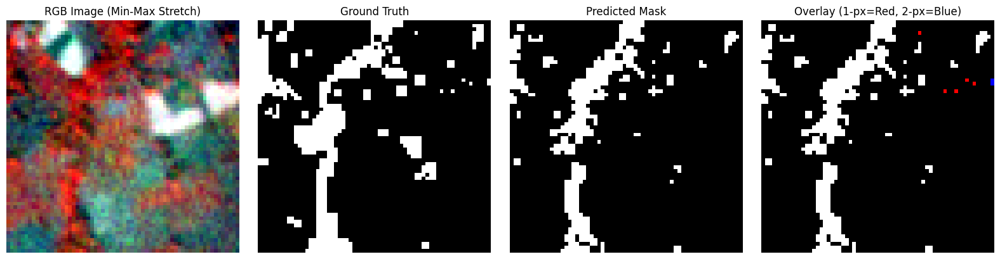

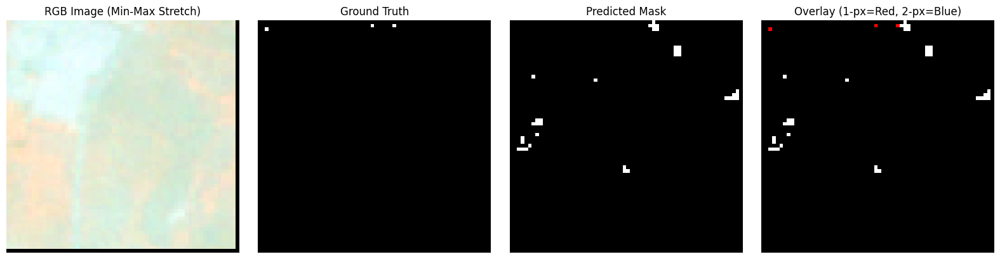

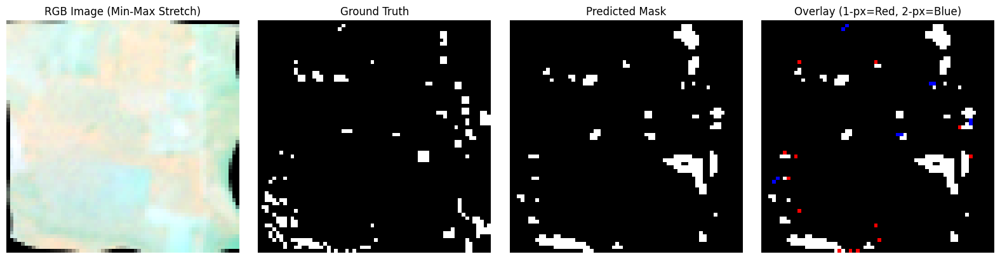

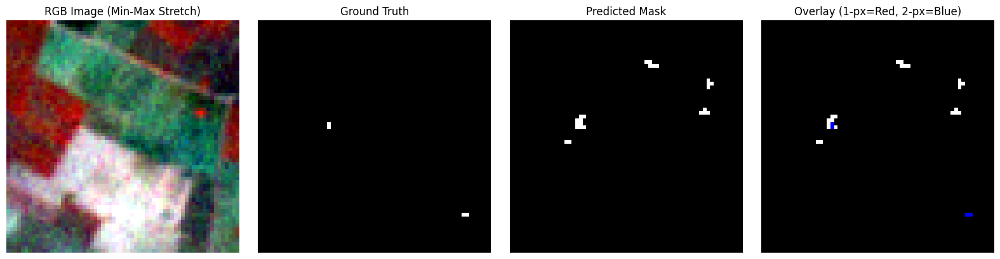

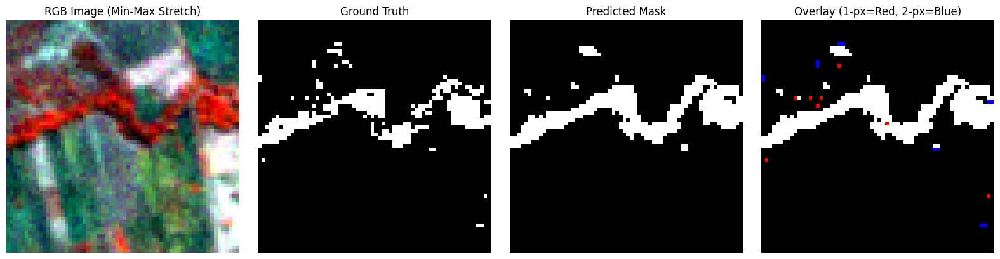

  0%|          | 0/15 [00:00<?, ?it/s]


In [32]:
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
import numpy as np
from tqdm import tqdm

# --- Function to convert (NIR, R, G) to RGB with min-max stretch ---
def convert_to_rgb(img):
    rgb = img[..., [1, 2, 0]].astype(np.float32)  # reorder to (R,G,NIR)
    for c in range(3):
        band = rgb[..., c]
        rgb[..., c] = (band - band.min()) / (band.max() - band.min() + 1e-8)
    return rgb

def get_components_of_size(mask, size_list=[1,2]):
    labeled = label(mask)
    comps = []
    for region in regionprops(labeled):
        if region.area in size_list:
            comp_mask = (labeled == region.label).astype(np.uint8)
            comps.append((comp_mask, region.area))
    return comps

def visualize_small_errors(X, gt, pred):
    try:
        t = threshold_otsu(pred)
    except:
        t = 0.5
    bin_pred = (pred >= t).astype(np.uint8)

    vis = np.zeros((*gt.shape, 3), dtype=np.uint8)
    small_gt_components = get_components_of_size(gt, size_list=[1,2])

    for comp_mask, area in small_gt_components:
        if area == 1:
            vis[comp_mask.astype(bool)] = [255, 0, 0]   # red = 1-pixel
        elif area == 2:
            vis[comp_mask.astype(bool)] = [0, 0, 255]   # blue = 2-pixel

    overlay = np.stack([bin_pred*255]*3, axis=-1).astype(np.uint8)
    blended = np.where(vis.sum(axis=-1, keepdims=True) > 0, vis, overlay)

    rgb_img = convert_to_rgb(X)

    fig, ax = plt.subplots(1, 4, figsize=(16, 4))
    ax[0].imshow(rgb_img)
    ax[0].set_title("RGB Image (Min-Max Stretch)")
    ax[1].imshow(gt, cmap="gray")
    ax[1].set_title("Ground Truth")
    ax[2].imshow(bin_pred, cmap="gray")
    ax[2].set_title("Predicted Mask")
    ax[3].imshow(blended)
    ax[3].set_title("Overlay (1-px=Red, 2-px=Blue)")
    
    for a in ax: a.axis("off")
    plt.tight_layout()
    plt.show()

# --- Visualize only first 5 patches ---
num_patches = 5
count = 0

for i in tqdm(range(len(val_gen))):
    X_batch, y_batch = val_gen[i]
    preds = model.predict(X_batch, verbose=0)

    for img_idx in range(len(X_batch)):
        X = X_batch[img_idx]              
        gt = y_batch[img_idx,...,0]       
        pred = preds[img_idx,...,0]       

        visualize_small_errors(X, gt, pred)
        count += 1
        if count >= num_patches:
            break
    if count >= num_patches:
        break

#### On the Test Set

  0%|          | 0/15 [00:00<?, ?it/s]

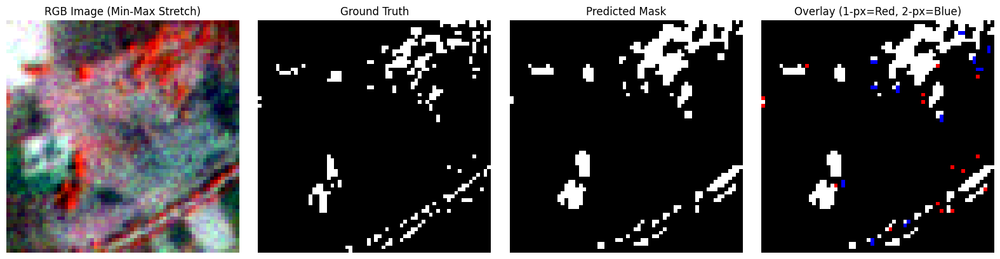

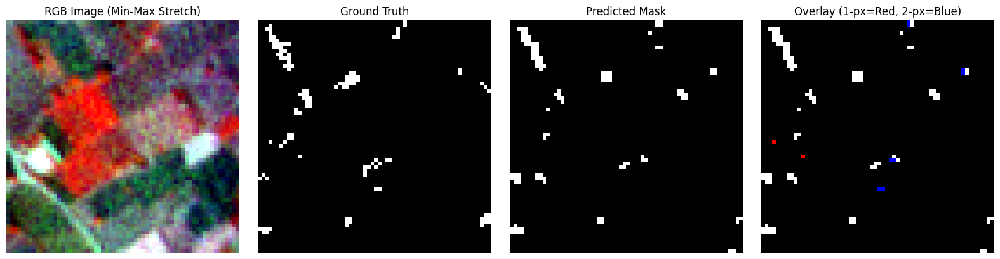

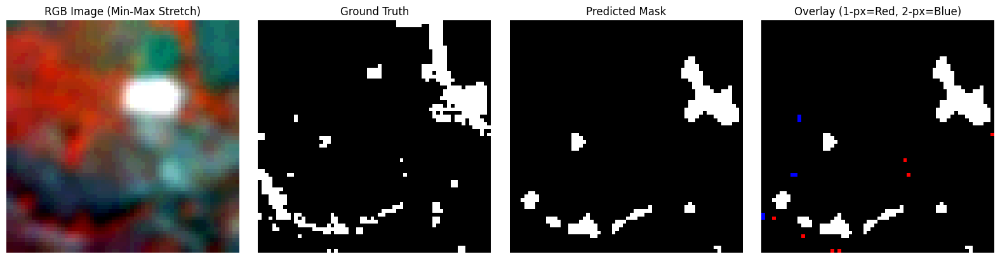

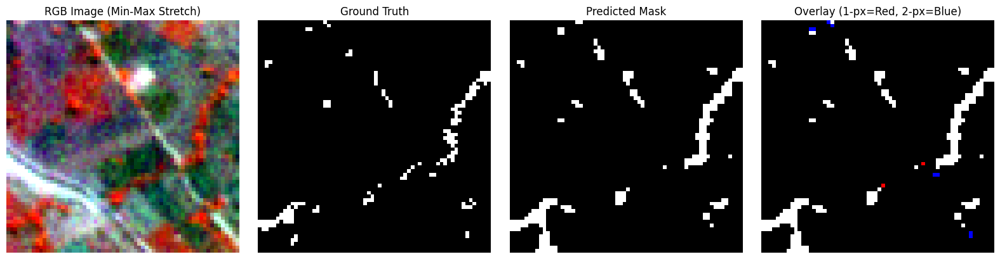

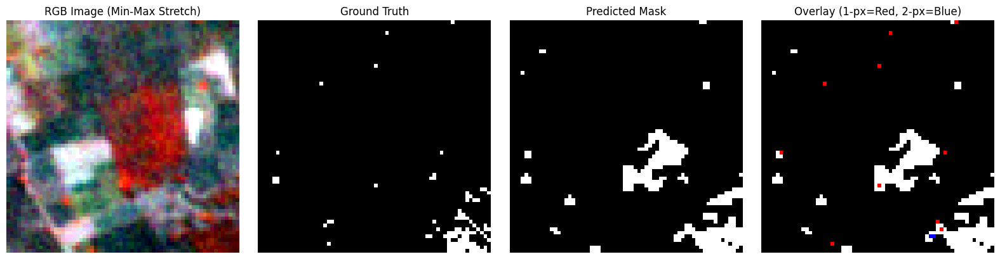

  0%|          | 0/15 [00:00<?, ?it/s]


In [33]:
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
import numpy as np
from tqdm import tqdm

# --- Function to convert (NIR, R, G) to RGB with min-max stretch ---
def convert_to_rgb(img):
    rgb = img[..., [1, 2, 0]].astype(np.float32)  # reorder to (R,G,NIR)
    for c in range(3):
        band = rgb[..., c]
        rgb[..., c] = (band - band.min()) / (band.max() - band.min() + 1e-8)
    return rgb

def get_components_of_size(mask, size_list=[1,2]):
    labeled = label(mask)
    comps = []
    for region in regionprops(labeled):
        if region.area in size_list:
            comp_mask = (labeled == region.label).astype(np.uint8)
            comps.append((comp_mask, region.area))
    return comps

def visualize_small_errors(X, gt, pred):
    try:
        t = threshold_otsu(pred)
    except:
        t = 0.5
    bin_pred = (pred >= t).astype(np.uint8)

    vis = np.zeros((*gt.shape, 3), dtype=np.uint8)
    small_gt_components = get_components_of_size(gt, size_list=[1,2])

    for comp_mask, area in small_gt_components:
        if area == 1:
            vis[comp_mask.astype(bool)] = [255, 0, 0]   # red = 1-pixel
        elif area == 2:
            vis[comp_mask.astype(bool)] = [0, 0, 255]   # blue = 2-pixel

    overlay = np.stack([bin_pred*255]*3, axis=-1).astype(np.uint8)
    blended = np.where(vis.sum(axis=-1, keepdims=True) > 0, vis, overlay)

    rgb_img = convert_to_rgb(X)

    fig, ax = plt.subplots(1, 4, figsize=(16, 4))
    ax[0].imshow(rgb_img)
    ax[0].set_title("RGB Image (Min-Max Stretch)")
    ax[1].imshow(gt, cmap="gray")
    ax[1].set_title("Ground Truth")
    ax[2].imshow(bin_pred, cmap="gray")
    ax[2].set_title("Predicted Mask")
    ax[3].imshow(blended)
    ax[3].set_title("Overlay (1-px=Red, 2-px=Blue)")
    
    for a in ax: a.axis("off")
    plt.tight_layout()
    plt.show()

# --- Visualize only first 5 patches ---
num_patches = 5
count = 0

for i in tqdm(range(len(test_gen))):
    X_batch, y_batch = test_gen[i]
    preds = model.predict(X_batch, verbose=0)

    for img_idx in range(len(X_batch)):
        X = X_batch[img_idx]              
        gt = y_batch[img_idx,...,0]       
        pred = preds[img_idx,...,0]       

        visualize_small_errors(X, gt, pred)
        count += 1
        if count >= num_patches:
            break
    if count >= num_patches:
        break

### Medium & Large Object Error Visualization
1. This Block visualizes segmentation errors for medium (3–5 px) and large (≥6 px) objects.
2. The predicted masks are compared with ground truth, and connected components are extracted by size.
3. Errors are highlighted with Green (medium) and Orange (large) overlays on the predicted mask.
4. Each sample also shows the original RGB image, ground truth, and binary prediction for clarity.
5. Only the first 5 patches from the test set are displayed for quick inspection.

#### On the Validation Set

  0%|          | 0/15 [00:00<?, ?it/s]

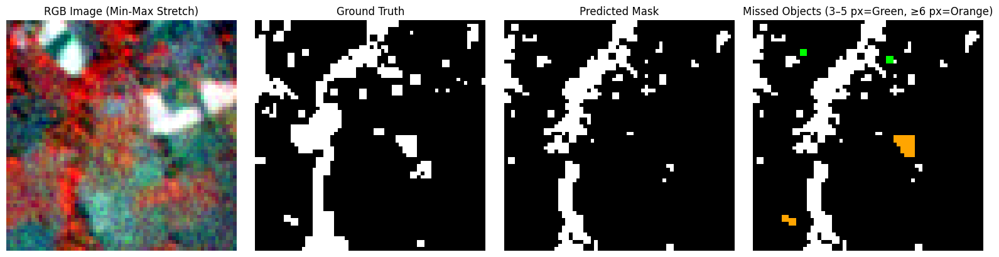

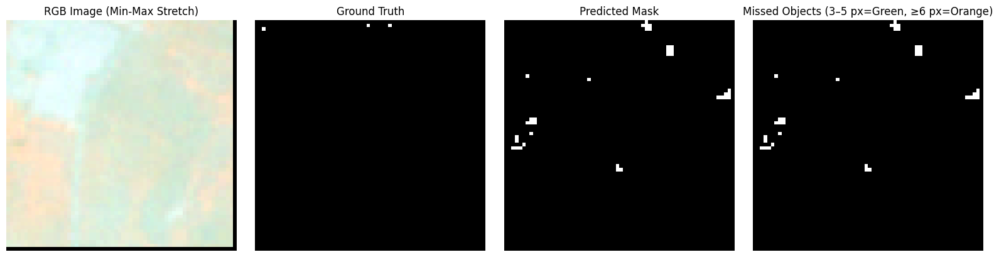

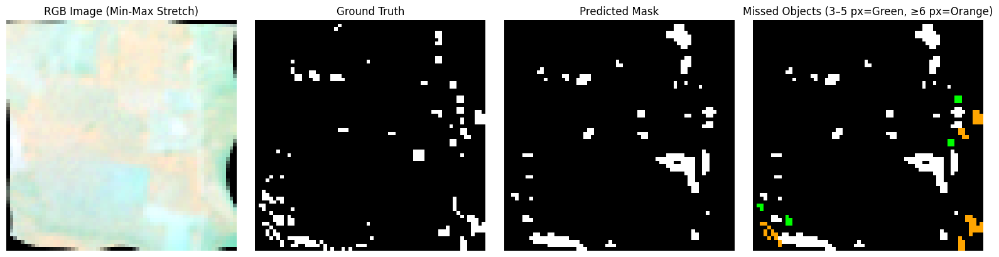

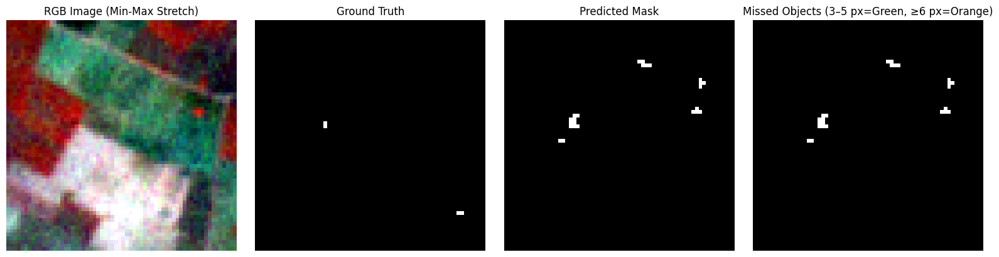

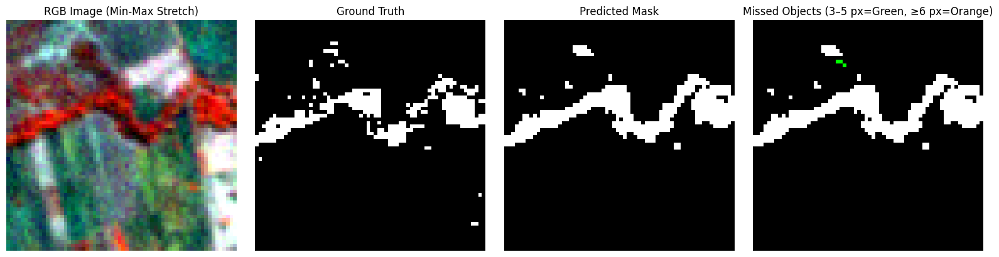

  0%|          | 0/15 [00:00<?, ?it/s]


In [34]:
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
import numpy as np
from tqdm import tqdm

# --- Function to convert (NIR, R, G) to RGB with min-max stretch ---
def convert_to_rgb(img):
    rgb = img[..., [1, 2, 0]].astype(np.float32)  # reorder to (R,G,NIR)
    for c in range(3):
        band = rgb[..., c]
        rgb[..., c] = (band - band.min()) / (band.max() - band.min() + 1e-8)
    return rgb

# --- Function to get components by size range ---
def get_components_by_size(mask, min_size=None, max_size=None):
    labeled = label(mask)
    comps = []
    for region in regionprops(labeled):
        area = region.area
        if (min_size is None or area >= min_size) and (max_size is None or area <= max_size):
            comp_mask = (labeled == region.label).astype(np.uint8)
            comps.append((comp_mask, area))
    return comps

# --- Visualization for *missed* medium & large objects ---
def visualize_missed_medium_large(X, gt, pred):
    # Threshold prediction map
    try:
        t = threshold_otsu(pred)
    except:
        t = 0.5
    bin_pred = (pred >= t).astype(np.uint8)

    vis = np.zeros((*gt.shape, 3), dtype=np.uint8)

    # Get medium (3–5 px) and large (≥6 px) GT objects
    medium_gt = get_components_by_size(gt, min_size=3, max_size=5)
    large_gt  = get_components_by_size(gt, min_size=6, max_size=None)

    # Check if each GT object is missed in prediction
    for comp_mask, area in medium_gt:
        overlap = bin_pred * comp_mask
        if overlap.sum() == 0:  # completely missed
            vis[comp_mask.astype(bool)] = [0, 255, 0]   # green = missed medium

    for comp_mask, area in large_gt:
        overlap = bin_pred * comp_mask
        if overlap.sum() == 0:  # completely missed
            vis[comp_mask.astype(bool)] = [255, 165, 0] # orange = missed large

    # Overlay: missed objects on top of prediction
    overlay = np.stack([bin_pred*255]*3, axis=-1).astype(np.uint8)
    blended = np.where(vis.sum(axis=-1, keepdims=True) > 0, vis, overlay)

    rgb_img = convert_to_rgb(X)

    # --- Plotting ---
    fig, ax = plt.subplots(1, 4, figsize=(16, 4))
    ax[0].imshow(rgb_img)
    ax[0].set_title("RGB Image (Min-Max Stretch)")
    ax[1].imshow(gt, cmap="gray")
    ax[1].set_title("Ground Truth")
    ax[2].imshow(bin_pred, cmap="gray")
    ax[2].set_title("Predicted Mask")
    ax[3].imshow(blended)
    ax[3].set_title("Missed Objects (3–5 px=Green, ≥6 px=Orange)")
    
    for a in ax: a.axis("off")
    plt.tight_layout()
    plt.show()

# --- Visualize only first 5 patches ---
num_patches = 5
count = 0

for i in tqdm(range(len(val_gen))):
    X_batch, y_batch = val_gen[i]
    preds = model.predict(X_batch, verbose=0)

    for img_idx in range(len(X_batch)):
        X = X_batch[img_idx]              
        gt = y_batch[img_idx,...,0]       
        pred = preds[img_idx,...,0]       

        visualize_missed_medium_large(X, gt, pred)
        count += 1
        if count >= num_patches:
            break
    if count >= num_patches:
        break

#### On the Test Set

  0%|          | 0/15 [00:00<?, ?it/s]

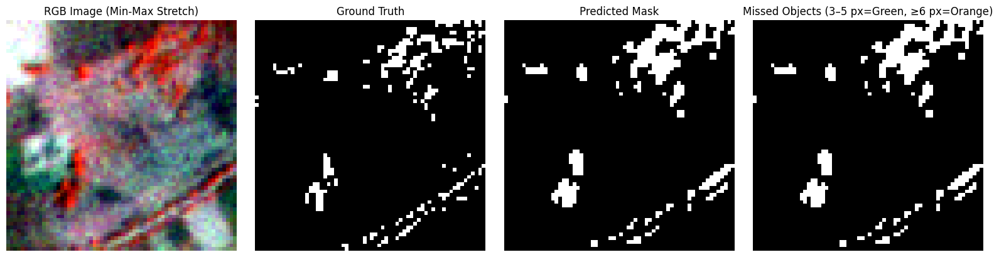

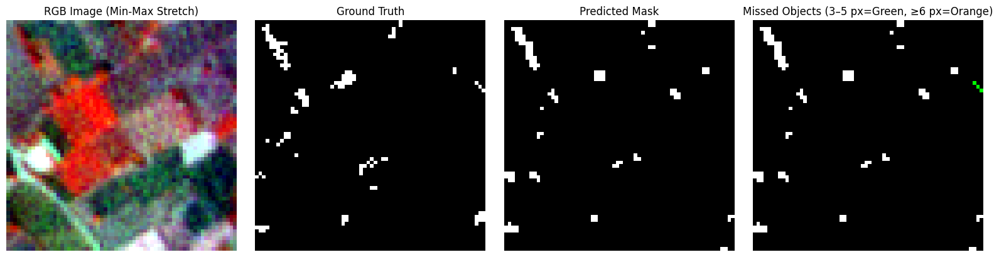

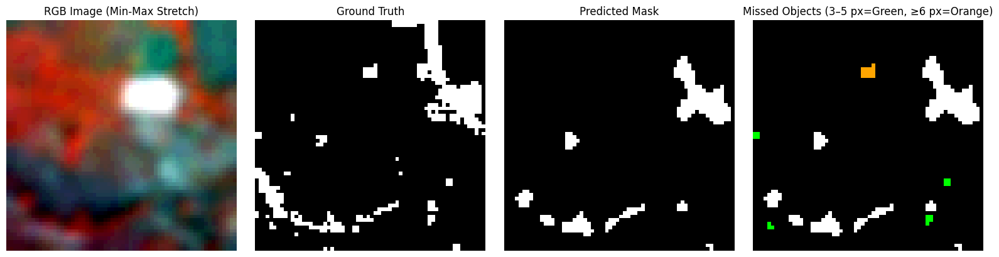

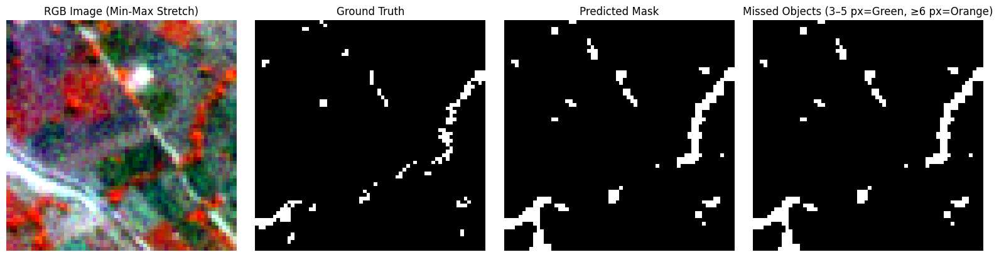

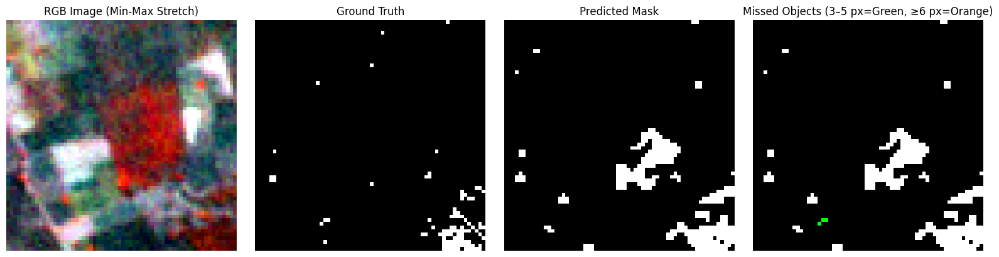

  0%|          | 0/15 [00:00<?, ?it/s]


In [35]:
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from skimage.measure import label, regionprops
import numpy as np
from tqdm import tqdm

# --- Function to convert (NIR, R, G) to RGB with min-max stretch ---
def convert_to_rgb(img):
    rgb = img[..., [1, 2, 0]].astype(np.float32)  # reorder to (R,G,NIR)
    for c in range(3):
        band = rgb[..., c]
        rgb[..., c] = (band - band.min()) / (band.max() - band.min() + 1e-8)
    return rgb

# --- Function to get components by size range ---
def get_components_by_size(mask, min_size=None, max_size=None):
    labeled = label(mask)
    comps = []
    for region in regionprops(labeled):
        area = region.area
        if (min_size is None or area >= min_size) and (max_size is None or area <= max_size):
            comp_mask = (labeled == region.label).astype(np.uint8)
            comps.append((comp_mask, area))
    return comps

# --- Visualization for *missed* medium & large objects ---
def visualize_missed_medium_large(X, gt, pred):
    # Threshold prediction map
    try:
        t = threshold_otsu(pred)
    except:
        t = 0.5
    bin_pred = (pred >= t).astype(np.uint8)

    vis = np.zeros((*gt.shape, 3), dtype=np.uint8)

    # Get medium (3–5 px) and large (≥6 px) GT objects
    medium_gt = get_components_by_size(gt, min_size=3, max_size=5)
    large_gt  = get_components_by_size(gt, min_size=6, max_size=None)

    # Check if each GT object is missed in prediction
    for comp_mask, area in medium_gt:
        overlap = bin_pred * comp_mask
        if overlap.sum() == 0:  # completely missed
            vis[comp_mask.astype(bool)] = [0, 255, 0]   # green = missed medium

    for comp_mask, area in large_gt:
        overlap = bin_pred * comp_mask
        if overlap.sum() == 0:  # completely missed
            vis[comp_mask.astype(bool)] = [255, 165, 0] # orange = missed large

    # Overlay: missed objects on top of prediction
    overlay = np.stack([bin_pred*255]*3, axis=-1).astype(np.uint8)
    blended = np.where(vis.sum(axis=-1, keepdims=True) > 0, vis, overlay)

    rgb_img = convert_to_rgb(X)

    # --- Plotting ---
    fig, ax = plt.subplots(1, 4, figsize=(16, 4))
    ax[0].imshow(rgb_img)
    ax[0].set_title("RGB Image (Min-Max Stretch)")
    ax[1].imshow(gt, cmap="gray")
    ax[1].set_title("Ground Truth")
    ax[2].imshow(bin_pred, cmap="gray")
    ax[2].set_title("Predicted Mask")
    ax[3].imshow(blended)
    ax[3].set_title("Missed Objects (3–5 px=Green, ≥6 px=Orange)")
    
    for a in ax: a.axis("off")
    plt.tight_layout()
    plt.show()

# --- Visualize only first 5 patches ---
num_patches = 5
count = 0

for i in tqdm(range(len(test_gen))):
    X_batch, y_batch = test_gen[i]
    preds = model.predict(X_batch, verbose=0)

    for img_idx in range(len(X_batch)):
        X = X_batch[img_idx]              
        gt = y_batch[img_idx,...,0]       
        pred = preds[img_idx,...,0]       

        visualize_missed_medium_large(X, gt, pred)
        count += 1
        if count >= num_patches:
            break
    if count >= num_patches:
        break

### Predictions on New Images

In [1]:
import os
import numpy as np
import tensorflow as tf
import tifffile as tiff
from PIL import Image
import matplotlib.pyplot as plt

# Paths
model_path = '/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/programs/notebooks/Current_working_codes/best_tversky_loss.h5'
test_images_dir = '/Users/kodukulasatyagopal/Downloads/Set4'
save_tif_dir = '/Users/kodukulasatyagopal/Downloads/Tversky_loss_tif_1'
save_png_dir = '/Users/kodukulasatyagopal/Downloads/Tversky_loss_png_1'

# Create output directories
os.makedirs(save_tif_dir, exist_ok=True)
os.makedirs(save_png_dir, exist_ok=True)

# Configuration
IMG_SIZE = (64, 64)
BATCH_SIZE = 32  # Set to 32 as requested
VISUALIZE_SUBSET = 100  # Save PNGs for first 100 images only

# Ensure float32 for compatibility
tf.keras.mixed_precision.set_global_policy('float32')

# Load the model
try:
    model = tf.keras.models.load_model(model_path, compile=False)
    print("Model loaded successfully.")
except Exception as e:
    print(f"Error loading model: {e}")
    exit()

# Preprocessing functions
def read_tif(path):
    """Return numpy array from a .tif file."""
    try:
        arr = tiff.imread(path)
        if arr.ndim != 3 or arr.shape[-1] != 3:
            print(f"Invalid image shape for {path}: {arr.shape}")
            return None
        return arr
    except Exception as e:
        print(f"Error reading .tif file {path}: {e}")
        return None

def preprocess_image_tif(img, out_size=IMG_SIZE):
    """
    Preprocess .tif image: reorder channels, resize if needed, percentile stretch, standardize.
    Assumes input channels are in order like NIR, R, G -> reorder to R, G, NIR.
    """
    if img is None:
        return None
    try:
        img = img[..., [1, 2, 0]].astype(np.float32)
        if img.shape[:2] != out_size:
            pil = Image.fromarray(img.astype(np.uint8))
            pil = pil.resize((out_size[1], out_size[0]), resample=Image.BILINEAR)
            img = np.array(pil).astype(np.float32)
        img_stretch = np.zeros_like(img, dtype=np.float32)
        for c in range(img.shape[-1]):
            band = img[..., c]
            low, high = np.percentile(band, (2, 98))
            band_clipped = np.clip(band, low, high)
            band_norm = (band_clipped - low) / (high - low + 1e-8)
            img_stretch[..., c] = band_norm
        for c in range(img_stretch.shape[-1]):
            b = img_stretch[..., c]
            img_stretch[..., c] = (b - b.mean()) / (b.std() + 1e-8)
        return img_stretch.astype(np.float32)
    except Exception as e:
        print(f"Error preprocessing image: {e}")
        return None

# Postprocess prediction
def postprocess_mask(pred, threshold=0.5):
    try:
        binary_mask = (pred > threshold).astype(np.uint8)
        return binary_mask
    except Exception as e:
        print(f"Error postprocessing mask: {e}")
        return None

# Visualization function
def visualize_and_save(input_img, pred_mask, save_path, idx):
    if idx >= VISUALIZE_SUBSET:
        return
    try:
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))
        input_display = np.clip((input_img - input_img.min()) / (input_img.max() - input_img.min() + 1e-8) * 255, 0, 255).astype(np.uint8)
        axs[0].imshow(input_display)
        axs[0].set_title('Input Image')
        axs[0].axis('off')
        axs[1].imshow(pred_mask, cmap='gray')
        axs[1].set_title('Predicted Mask (1: Tree, 0: Non-Tree)')
        axs[1].axis('off')
        plt.savefig(save_path)
        plt.close()
    except Exception as e:
        print(f"Error during visualization for {save_path}: {e}")

# Batch generator
def test_image_generator(image_paths, batch_size):
    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths[i:i + batch_size]
        batch_images = []
        valid_paths = []
        for img_path in batch_paths:
            raw_img = read_tif(img_path)
            if raw_img is None:
                continue
            preprocessed_img = preprocess_image_tif(raw_img)
            if preprocessed_img is None:
                continue
            batch_images.append(preprocessed_img)
            valid_paths.append(img_path)
        if batch_images:
            yield np.array(batch_images, dtype=np.float32), valid_paths

# Get test images
try:
    test_image_paths = [os.path.join(test_images_dir, f) for f in os.listdir(test_images_dir) if f.endswith('.tif')]
    print(f"Found {len(test_image_paths)} test images.")
except Exception as e:
    print(f"Error listing test images: {e}")
    exit()

# Process images in batches
total_processed = 0
for batch_images, batch_paths in test_image_generator(test_image_paths, BATCH_SIZE):
    try:
        preds = model.predict(batch_images, batch_size=BATCH_SIZE, verbose=0)
        print(f"Processed batch of {len(batch_paths)} images. Total: {total_processed + len(batch_paths)}/{len(test_image_paths)}")
        
        for i, (pred, img_path) in enumerate(zip(preds, batch_paths)):
            binary_mask = postprocess_mask(pred[..., 0])
            if binary_mask is None:
                continue
            mask_tif_path = os.path.join(save_tif_dir, f'pred_mask_{os.path.basename(img_path)}')
            try:
                tiff.imwrite(mask_tif_path, binary_mask)
            except Exception as e:
                print(f"Error saving .tif for {mask_tif_path}: {e}")
                continue
            vis_png_path = os.path.join(save_png_dir, f'vis_{os.path.basename(img_path)}.png')
            visualize_and_save(batch_images[i], binary_mask, vis_png_path, total_processed + i)
        
        total_processed += len(batch_paths)
        del batch_images, preds
        tf.keras.backend.clear_session()
    except Exception as e:
        print(f"Error processing batch: {e}")
        continue

print(f"Predictions completed. TIF masks saved in: {save_tif_dir}")
print(f"PNG visualizations saved for first {min(VISUALIZE_SUBSET, total_processed)} images in: {save_png_dir}")

Model loaded successfully.
Found 82719 test images.
Processed batch of 32 images. Total: 32/82719
Processed batch of 32 images. Total: 64/82719
Processed batch of 32 images. Total: 96/82719
Processed batch of 32 images. Total: 128/82719
Processed batch of 32 images. Total: 160/82719
Processed batch of 32 images. Total: 192/82719
Processed batch of 32 images. Total: 224/82719
Processed batch of 32 images. Total: 256/82719
Processed batch of 32 images. Total: 288/82719
Processed batch of 32 images. Total: 320/82719
Processed batch of 32 images. Total: 352/82719
Processed batch of 32 images. Total: 384/82719
Processed batch of 32 images. Total: 416/82719
Processed batch of 32 images. Total: 448/82719
Processed batch of 32 images. Total: 480/82719
Processed batch of 32 images. Total: 512/82719
Processed batch of 32 images. Total: 544/82719
Processed batch of 32 images. Total: 576/82719
Processed batch of 32 images. Total: 608/82719
Processed batch of 32 images. Total: 640/82719
Processed b

### Coordinate Reference System

In [1]:
# Some other code :
import os
import numpy as np
import rasterio

# Paths
original_images_dir = "/Users/kodukulasatyagopal/Downloads/Set4"   # folder with chip_000.tif
predicted_masks_dir = "/Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_tif_1"   # folder with pred_mask_chip_000.tif
output_dir = "/Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_CRS_tif_1"   # final output

os.makedirs(output_dir, exist_ok=True)

for mask_file in os.listdir(predicted_masks_dir):
    if not mask_file.endswith(".tif"):
        continue
    
    chip_name = mask_file.replace("pred_mask_", "")
    original_file = os.path.join(original_images_dir, chip_name)

    mask_path = os.path.join(predicted_masks_dir, mask_file)
    output_path = os.path.join(output_dir, mask_file)

    if not os.path.exists(original_file):
        print(f"⚠️ Skipping {mask_file}, no matching original {chip_name}")
        continue

    # Step 1: Read original CRS + transform
    with rasterio.open(original_file) as src:
        crs = src.crs
        transform = src.transform
        width, height = src.width, src.height

    # Step 2: Read predicted mask
    with rasterio.open(mask_path) as mask_src:
        mask_data = mask_src.read(1)

    # 🔑 Ensure mask is strictly 0 or 1
    mask_data = (mask_data > 0).astype(np.uint8)

    # 🔄 Invert mask so trees=1(black), background=0(white)
    mask_data = 1 - mask_data

    # Step 3: Define a clean profile for mask
    profile = {
        "driver": "GTiff",
        "height": height,
        "width": width,
        "count": 1,
        "dtype": "uint8",
        "crs": crs,
        "transform": transform,
        "nodata": 0
    }

    # Step 4: Write georeferenced mask
    with rasterio.open(output_path, "w", **profile) as dst:
        dst.write(mask_data, 1)

    print(f"✅ Saved georeferenced mask: {output_path} | Range: {mask_data.min()}–{mask_data.max()}")


/Users/kodukulasatyagopal/Documents/Projects/ISRO_Intern/programs/project_env/lib/python3.10/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


✅ Saved georeferenced mask: /Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_CRS_tif_1/pred_mask_chip_54663.tif | Range: 0–1
✅ Saved georeferenced mask: /Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_CRS_tif_1/pred_mask_chip_80354.tif | Range: 0–1
✅ Saved georeferenced mask: /Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_CRS_tif_1/pred_mask_chip_12636.tif | Range: 0–1
✅ Saved georeferenced mask: /Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_CRS_tif_1/pred_mask_chip_35289.tif | Range: 0–1
✅ Saved georeferenced mask: /Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_CRS_tif_1/pred_mask_chip_44470.tif | Range: 0–1
✅ Saved georeferenced mask: /Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_CRS_tif_1/pred_mask_chip_75875.tif | Range: 0–1
✅ Saved georeferenced mask: /Users/kodukulasatyagopal/Downloads/Predictions_on_dat

### Mosaicking

In [ ]:
import os
import numpy as np
import rasterio
from rasterio.merge import merge

input_dir = "/Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_CRS_tif_1"
output_mosaic = "/Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_mosaic_1.tif"

mask_files = [os.path.join(input_dir, f) for f in os.listdir(input_dir) if f.endswith(".tif")]

# Merge all rasters
mosaic, out_trans = merge(mask_files)

# Invert values: original Tree=0, Non-tree=1 → now Tree=1, Non-tree=0
mosaic = np.where(mosaic == 0, 1, 0).astype(np.uint8)

# Copy metadata from first file
with rasterio.open(mask_files[0]) as src0:
    out_meta = src0.meta.copy()

out_meta.update({
    "driver": "GTiff",
    "height": mosaic.shape[1],
    "width": mosaic.shape[2],
    "transform": out_trans,
    "dtype": "uint8",
    "compress": "DEFLATE",
    "BIGTIFF": "YES",
    "tiled": True
})

# Save final mosaic
with rasterio.open(output_mosaic, "w", **out_meta) as dest:
    dest.write(mosaic)

print(f"✅ Final mosaic saved at: {output_mosaic}")

✅ Final mosaic saved at: /Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_1.tif


### Aggregation

In [2]:
import rasterio
from rasterio.enums import Resampling

# Input mosaic (5m resolution)
input_mosaic = "/Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_mosaic_1.tif"

# Output aggregated raster (100m resolution, values 0–100)
output_agg = "/Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_aggregation_100m.tif"

# Open input mosaic
with rasterio.open(input_mosaic) as src:
    # Read metadata
    profile = src.profile.copy()

    # Current resolution
    res_x, res_y = src.res
    print(f"Original resolution: {res_x} x {res_y} meters")

    # Target resolution = 100m
    target_res = 100

    # Scale factor (how many input pixels fit into one output pixel)
    scale = target_res / res_x   # should be 20 if res_x = 5

    # Calculate new dimensions
    new_height = int(src.height / scale)
    new_width = int(src.width / scale)

    # Read and resample using average (mean aggregation)
    data = src.read(
        out_shape=(src.count, new_height, new_width),
        resampling=Resampling.average
    )

    # Convert to percentage (0–100)
    data = data * 100.0
    data = data.astype("float32")  # ensure float32

    # Adjust transform for new resolution
    transform = src.transform * src.transform.scale(
        (src.width / data.shape[-1]),
        (src.height / data.shape[-2])
    )

    # Update metadata for output
    profile.update({
        "driver": "GTiff",
        "height": data.shape[1],
        "width": data.shape[2],
        "transform": transform,
        "dtype": "float32",
        "compress": "DEFLATE",
        "tiled": True,
        "BIGTIFF": "YES"
    })

    # Save the aggregated raster
    with rasterio.open(output_agg, "w", **profile) as dst:
        dst.write(data)

print(f"✅ Aggregated raster saved at: {output_agg} (values 0–100%)")

Original resolution: 4.999999999999998 x 4.999999999999998 meters
✅ Aggregated raster saved at: /Users/kodukulasatyagopal/Downloads/Predictions_on_data/Tversky/Tversky_loss_aggregation_100m.tif (values 0–100%)
